##  TODO:
- update the README, (starting from logbookreader probably)
- separate IME and USTC analysis
    - downside, I might want to change things in both
    - maybe I need to make shared functions to analyze/plot

In [1]:
from importlib import reload # to reload modules
import numpy as np # NumPy
import matplotlib.pylab as plt # Matplotlib plots
import matplotlib.patches as mpatches
from matplotlib import colormaps # colormaps
from matplotlib.colors import hsv_to_rgb
from matplotlib.legend_handler import HandlerLine2D

import pandas as pd # Pandas
import uproot
import pickle
import logging
import pprint
from adjustText import adjust_text

import os # read directories etc.
from scipy.optimize import curve_fit
import pylandau

# import time
# from timeout_decorator import timeout

import LoadBatch
reload(LoadBatch)
from LoadBatch import *
from SensorClasses import *

verbose = False

In [2]:
# logging.basicConfig(level=logging.WARNING, format='[%(levelname)s] -\t %(message)s')
logging.basicConfig(level=logging.INFO, format='[%(levelname)s] - \t %(message)s')

In [3]:
# PIXEL_SIZE = 0.0184 #mm

### choose the bins so that they match the MIMOSA pixels (which are just the coordinates)
### I should just have many options for ranges and choose between those
large_bins = (np.arange(0, 900,1),
              np.arange(0, 600,1))

bins1 = (np.arange(450, 700, 1),
        np.arange(100, 500, 1))

bins2 = (np.arange(350, 700, 1),
              np.arange(100, 500, 1))

bins3 = (np.arange(300, 800, 1),
              np.arange(0, 450, 1))

bins4 = (np.arange(500, 800, 1),
              np.arange(100, 500, 1))

### Load the dictionary of sensor names and runs
# dict_of_runs = read_pickle("dict_of_runs.pickle")
dict_of_batches = read_pickle("dict_of_batches.pickle")

# logging.info(f"dictionary of the runs: \n{dict_of_runs.keys()}")
logging.info(f"dictionary of the batches: \n{dict_of_batches.keys()}")

### branches to be loaded (+ unnecessary columns)
branches = ["eventNumber", "Xtr", "Ytr", "pulseHeight", "charge", "noise", "timeCFD20", "timeCFD50", "timeCFD70"]
columns_to_remove = ["Xtr_4","Xtr_5","Xtr_6","Xtr_7","Ytr_4","Ytr_5","Ytr_6","Ytr_7"]

### charge fit folder
charge_fit_dir = "/home/marcello/Desktop/Radboud_not_synchro/Master_Thesis/testbeam-analysis/ROOT Langaus fit/Charge_fit_results"

### presentation path
pres_path = '/home/marcello/Desktop/Radboud_not_synchro/Master_Thesis/Presentations/2024-01-25'

[INFO] - 	 dictionary of the batches: 
dict_keys([199, 100, 101, 201, 202, 203, 301, 401, 402, 403, 204, 406, 407, 408, 409, 410, 411, 412, 205, 206, 413, 414, 501, 502, 503, 504, 505, 601, 602, 603, 604, 605, 701, 702, 801, 802, 901, 902, 1001, 1002, 1101, 1102, 1201, 1202, 1301, 1302, 1303, 1304, 1305, 1306, 503.1, 503.2])


In [4]:
#  already run: charge:
bins_dict = {
    100:bins3, # x x
    101:bins3, # x x
    199:bins3, # x x
    201:bins1, # x x
    202:bins1, # x x
    203:bins1, # x x
    204:bins1, # x x   # weird time resolution
    205:bins4, # x x
    206:bins4, # x x
    301:bins1, # x x
    401:bins1, # x x
    402:bins1, # x x
    403:bins1, # x x
    407:bins1, # x x
    408:bins1, # x x
    409:bins1, # x x
    410:bins1, # x x
    411:bins1, # x x    sensor Ch2 in S1 probably outside area of interest
    413:bins1, # x x
    414:bins1, # x x
    501:bins2, # x x   (in all 5xx, S1 and S2: use=time in the geometry_mask) sensor Ch2 in S1 seems weird
    502:bins2, # x x
    503:bins2, # x x   sensors moved during the diffent runs (because the temperature changed, OR I EXCLUDE THEM AND STUDY THEM SEPARATELY)
    504:bins2, # x x   sensor ch4 in S1 is very irradiated and seems to have negative pulseHeight BG noise
    505:bins2, # x x   sensor Ch4 in S1 seems dead, sensor Ch2 ins S2 
    601:bins4, # x x   in all 6xx, Ch2 in S2 seem to be cut out (use=time)  Ch4 in S2 seems dead or outside area
    602:bins4, # x x   (S1: use=pulseheight,   S2: use=time)
    603:bins4, # x x   (S1: use=pulseheight,   S2: use=time)
    604:bins4, # x x   (S1: use=pulseheight,   S2: use=time)
    605:bins4, # x x   (S1: use=pulseheight,   S2: use=time)
    701:bins1, # x x
    702:bins1, # x x
    801:bins1, # x x
    802:bins1, # x x
    901:bins1, # x x  (S1: use=time)  sensor Ch3 in S1 is outside the FEi4 area (or dead)
    902:bins1, # x x  (S1: use=time)
    1001:bins2, # x x  (S1 and S2 use=time)
    1002:bins2, # x x  sensor ch4 in S2 seems dead
    1101:bins2, # x x  sensor ch3 in S2 seems weird
    1102:bins2, # x x  sensor ch2 and ch3 are outside the area
    1201:bins2, # x x  sensor ch3 in S1 is missing the name (should be 'CNM W5')
    1202:bins2, # x x
}

In [5]:
unique_names = []
for batch_object in dict_of_batches.values():
    for S in ['S1','S2']:
        for ch, sensor in batch_object.S[S].channels.items():
            if (sensor.name != '') and (sensor.name not in unique_names):
                unique_names.append(sensor.name)
logging.info(f"{unique_names}")

for name in unique_names:
    for batch_object in dict_of_batches.values():
        for S in ['S1','S2']:  
                for ch, sensor in batch_object.S[S].channels.items():
                    if (sensor.name == name):
                        if (sensor.voltage == 0) or (sensor.voltage is None): continue 
                        print(f"{sensor.name}, board: {sensor.board}\tV: {sensor.voltage}, angle: {batch_object.angle}°,", "temp: %.2f°C,"%batch_object.temperature, f"fluence: {sensor.fluence}, in batch {batch_object.batch_number}, {S}, {ch})")
    print('-'*100)

[INFO] - 	 ['MCP', 'IMEv3-W12-C2-2-2', 'IMEv3-W12-C3-1-4', 'CNM-R15973-W5-D138', 'CNM-R15973-W4-D168', 'IMEv3-W12-C3-1-5', 'USTC2.1-W17-P6-A', 'no_board', 'JSI-PP4-IMEv2-W7-6.5E14', 'JSI-B7-IMEv3-W16-8E14', 'JSI-B13-IMEv3-W16-2.5E15', 'JSI-B6-IMEv2-W7-1E14', 'JSI-PP1', 'CERN2-CH0-IMEv3-W12', 'CERN2-CH1-IMEv3-W12', 'CERN2-CH2-IMEv3-W12', 'JSI-B5-CNM-W3-2.5E15', 'CERN2-CH4-IMEv3-W16']


MCP, board: no_board	V: 2600, angle: 0.0°, temp: -31.17°C, fluence: 0, in batch 199, S1, Ch1)
MCP, board: no_board	V: 2600, angle: 0.0°, temp: -31.17°C, fluence: 0, in batch 199, S2, Ch1)
MCP, board: no_board	V: 2500, angle: 0.0°, temp: -32.87°C, fluence: 0, in batch 100, S1, Ch1)
MCP, board: no_board	V: 2500, angle: 0.0°, temp: -32.87°C, fluence: 0, in batch 100, S2, Ch1)
MCP, board: no_board	V: 2500, angle: 0.0°, temp: -33.45°C, fluence: 0, in batch 101, S1, Ch1)
MCP, board: no_board	V: 2500, angle: 0.0°, temp: -33.45°C, fluence: 0, in batch 101, S2, Ch1)
MCP, board: no_board	V: 2500, angle: 0.0°, temp: -31.75°C, fluence: 0, in batch 201, S1, Ch1)
MCP, board: no_board	V: 2500, angle: 0.0°, temp: -31.75°C, fluence: 0, in batch 201, S2, Ch1)
MCP, board: no_board	V: 2500, angle: 0.0°, temp: -32.45°C, fluence: 0, in batch 202, S1, Ch1)
MCP, board: no_board	V: 2500, angle: 0.0°, temp: -32.45°C, fluence: 0, in batch 202, S2, Ch1)
MCP, board: no_board	V: 2500, angle: 0.0°, temp: -32.58°C, f

In [6]:
unique_names

['MCP',
 'IMEv3-W12-C2-2-2',
 'IMEv3-W12-C3-1-4',
 'CNM-R15973-W5-D138',
 'CNM-R15973-W4-D168',
 'IMEv3-W12-C3-1-5',
 'USTC2.1-W17-P6-A',
 'no_board',
 'JSI-PP4-IMEv2-W7-6.5E14',
 'JSI-B7-IMEv3-W16-8E14',
 'JSI-B13-IMEv3-W16-2.5E15',
 'JSI-B6-IMEv2-W7-1E14',
 'JSI-PP1',
 'CERN2-CH0-IMEv3-W12',
 'CERN2-CH1-IMEv3-W12',
 'CERN2-CH2-IMEv3-W12',
 'JSI-B5-CNM-W3-2.5E15',
 'CERN2-CH4-IMEv3-W16']

# IME
looking specifically at one sensor

In [7]:
this_sensor = 'IME'
IME_names = []
for name in unique_names:
    if this_sensor in name:
        print(name)
        IME_names.append(name)
        
IME_names.sort()


IMEv3-W12-C2-2-2
IMEv3-W12-C3-1-4
IMEv3-W12-C3-1-5
JSI-PP4-IMEv2-W7-6.5E14
JSI-B7-IMEv3-W16-8E14
JSI-B13-IMEv3-W16-2.5E15
JSI-B6-IMEv2-W7-1E14
CERN2-CH0-IMEv3-W12
CERN2-CH1-IMEv3-W12
CERN2-CH2-IMEv3-W12
CERN2-CH4-IMEv3-W16


In [9]:
### there's many irradiated levels (4)
### 1E14, 6.5E14, 8E14, 2.5E15
IME_list = []

IME_dict = {'room_temp':[], 'angled':[], 'angled_irradiated':[], 'normal_2500':[], 'normal_2600':[], 'irradiated_2800':[]}

4### I want to remove the 2500, 2600, 2800
# IME_dict = {'room_temp':[], 'angled':[], 'angled_irradiated':[], 'normal_2500':[], 'normal_2600':[], 'irradiated_2800':[]}

for name in IME_names:
    ### maybe I can make all this weird iterations into a function
    for batch_object in dict_of_batches.values():
        for S in ['S1','S2']:
            for ch, sensor in batch_object.S[S].channels.items():
                if name in sensor.name:
#                     print(batch_object.batch_number, S, ch, batch_object.S[S].get_sensor(ch).board, batch_object.S[S].get_sensor(ch).board == ' ')
                    if (batch_object.S[S].get_sensor(ch).voltage==0) or (batch_object.S[S].get_sensor(ch).board == NO_BOARD): ### if the voltage is 0, or there is no board name, it's not useful
                        continue
                    IME_list.append((batch_object.batch_number, S, ch))
                    if batch_object.temperature<0 and batch_object.S[S].get_sensor('Ch1').voltage==2500 and batch_object.angle==0 \
                    and batch_object.S[S].get_sensor(ch).fluence==0:
                        IME_dict['normal_2500'].append((batch_object.batch_number, S, ch))
                    if batch_object.temperature<0 and batch_object.S[S].get_sensor('Ch1').voltage==2600 and batch_object.angle==0 \
                    and batch_object.S[S].get_sensor(ch).fluence==0:
                        IME_dict['normal_2600'].append((batch_object.batch_number, S, ch))    
                    if batch_object.temperature<0 and batch_object.S[S].get_sensor('Ch1').voltage==2800 and batch_object.angle==0 \
                    and batch_object.S[S].get_sensor(ch).fluence!=0 and batch_object.angle==0:
                        IME_dict['irradiated_2800'].append((batch_object.batch_number, S, ch))
                    if batch_object.temperature>0:
                        IME_dict['room_temp'].append((batch_object.batch_number, S, ch))
                    if batch_object.angle>0 and batch_object.S[S].get_sensor(ch).fluence==0:
                        IME_dict['angled'].append((batch_object.batch_number, S, ch))
#                         print(batch_object.S[S].get_sensor(ch).voltage)
                    if batch_object.angle>0 and batch_object.S[S].get_sensor(ch).fluence!=0:
                        IME_dict['angled_irradiated'].append((batch_object.batch_number, S, ch))
                        
                        
    ### remove empty entries
#     IME_dict[name] = {key: value for key, value in IME_dict.items() if value}

# logging.info(f"{IME_list}")

###

In [10]:
# key_to_study = 'room_temp'
# key_to_study = 'normal_2500'
# key_to_study = 'irradiated_2800'
key_to_study = 'angled'
# key_to_study = 'angled_irradiated'

batches_to_study = IME_dict[key_to_study]

this_sensor = 'IME'
threshold_charge = 4 #fC


save_path = f'../various plots/{this_sensor}/{key_to_study}/'
if not os.path.isdir(save_path):
    os.mkdir(save_path)

### I should save the dictionary and just reopen it to add the other data
IME_file_name = os.path.join(f"../various plots/{this_sensor}","IME_analysis_dict.pickle")

### and I probably need to add fluence too 
columns_df = ['name', 'board', 'voltage', 'MCP_voltage', 'temperature', 'angle', 'fluence', 'charge', 'charge_error', 'efficiency', 'time_resolution', 'comments', 'exclude']
# print("TOTAL COLUMNS NUMBER:",len(columns_df))
### open file to read dictionary, if it doesn't exist make a new one
try:
    dict_analysis_IME = read_pickle(IME_file_name)
    df_analysis = dict_analysis_IME[key_to_study]
    multi_index = df_analysis.index
except FileNotFoundError:
    logging.warning("file does not exist, creating new empty dictionary to store dataframes")
    dict_analysis_IME = {}
    multi_index = pd.MultiIndex.from_tuples(batches_to_study, names=['batch', 'oscilloscope', 'channel'])
    df_analysis = pd.DataFrame(index=multi_index, columns=columns_df)
except KeyError:
    logging.warning(f"{key_to_study} not studied yet, create empty dataframe")
    multi_index = pd.MultiIndex.from_tuples(batches_to_study, names=['batch', 'oscilloscope', 'channel'])
    df_analysis = pd.DataFrame(index=multi_index, columns=columns_df)

### option to just make a new empty dataframe
MAKE_NEW_DF = False
if MAKE_NEW_DF:
    logging.warning("Creating empty dataframe anyways")
    multi_index = pd.MultiIndex.from_tuples(batches_to_study, names=['batch', 'oscilloscope', 'channel'])
    df_analysis = pd.DataFrame(index=multi_index, columns=columns_df)

    
idx=pd.IndexSlice

In [28]:
# df_analysis

[INFO] - 	 Loading batch 501 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-26.57°C
channels: Index(['Ch4', 'Ch3', 'Ch2'], dtype='object', name='channel')
Batch:501, Scope:S1, Channel:Ch4


[INFO] - 	 in 'time_mask()': Fit parameters [ 2.53609936e+04 -5.99772133e+03  8.66134246e+01  1.23399043e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.34860077e+04 -5.99902205e+03  8.45281376e+01  7.94278026e+00]


Batch:501, Scope:S1, Channel:Ch3


[INFO] - 	 in 'time_mask()': Fit parameters [ 4.51467092e+04 -6.14197642e+03  6.07376762e+01  9.24462786e+00]
[INFO] - 	 in 'time_mask()': Fit parameters [ 4.39516211e+04 -6.14204053e+03  6.03175945e+01  4.87936139e+00]


Batch:501, Scope:S1, Channel:Ch2


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[WARNING] - 	 No MIN found after 20 iterations
[ERROR] - 	 in 'geometry_mask()', something wrong, no boolean mask
[INFO] - 	 in 'time_mask()': Fit parameters [ 9646.20866911 -6186.97035897   115.05367392   162.47062312]
[INFO] - 	 using 'time' instead of 'pulseheight' for geometry_cut
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.12027203e+04 -6.18559195e+03  1.13379713e+02  1.66971886e+01]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[WARNING] - 	 No MIN found aft

MCP: 2800 V, angle: 0.0° temperature:-26.57°C
channels: Index(['Ch2'], dtype='object', name='channel')
Batch:501, Scope:S2, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 1.46571442e+04 -5.81669879e+03  7.03983423e+01  2.95746983e+00]
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.40141360e+04 -5.81684856e+03  7.01059047e+01  1.54519624e+00]
[INFO] - 	 Loading batch 502 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-26.47°C
channels: Index(['Ch4', 'Ch3', 'Ch2'], dtype='object', name='channel')
Batch:502, Scope:S1, Channel:Ch4


[INFO] - 	 in 'time_mask()': Fit parameters [ 2.93860124e+04 -5.98819894e+03  7.67528114e+01  1.09382120e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.80957626e+04 -5.98907343e+03  7.58998725e+01  7.48134335e+00]


Batch:502, Scope:S1, Channel:Ch3


[INFO] - 	 in 'time_mask()': Fit parameters [ 6.09838231e+04 -6.12514063e+03  4.60687036e+01  7.54919492e+00]
[INFO] - 	 in 'time_mask()': Fit parameters [ 5.99295518e+04 -6.12525089e+03  4.59064869e+01  3.20310405e+00]


Batch:502, Scope:S1, Channel:Ch2


[WARNING] - 	 No MIN found after 20 iterations
[ERROR] - 	 in 'geometry_mask()', something wrong, no boolean mask
[INFO] - 	 in 'time_mask()': Fit parameters [11479.91966246 -6185.71306457    96.07918384   162.84818893]
[INFO] - 	 using 'time' instead of 'pulseheight' for geometry_cut
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.56003187e+04 -6.18446325e+03  9.45432903e+01  1.50306016e+01]
[WARNING] - 	 No MIN found after 20 iterations
[ERROR] - 	 pulseHeight cut failed
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.47452741e+04 -6.18595079e+03  9.35765080e+01  1.18313588e+01]
[INFO] - 	 Loading batch 502 	 Oscilloscope S2


MCP: 2800 V, angle: 0.0° temperature:-26.47°C
channels: Index(['Ch2'], dtype='object', name='channel')
Batch:502, Scope:S2, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 1.95081492e+04 -5.81861554e+03  5.63674462e+01  3.46419171e+00]
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.92569449e+04 -5.81870881e+03  5.59347441e+01  1.49081835e+00]
[INFO] - 	 Loading batch 503 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-29.47°C
channels: Index(['Ch4', 'Ch3', 'Ch2'], dtype='object', name='channel')
Batch:503, Scope:S1, Channel:Ch4


[INFO] - 	 in 'time_mask()': Fit parameters [ 1.32597169e+04 -5.97572640e+03  6.75039942e+01  1.15116771e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.22563265e+04 -5.97605593e+03  6.69233274e+01  2.97806096e+00]


Batch:503, Scope:S1, Channel:Ch3


[INFO] - 	 in 'time_mask()': Fit parameters [ 6.65817235e+04 -6.11254207e+03  3.62891587e+01  2.14086550e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 6.55185433e+04 -6.11262019e+03  3.59733402e+01  3.60250986e+00]


Batch:503, Scope:S1, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 2.27523165e+04 -6.17375930e+03  7.52724038e+01  1.36479451e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.17866587e+04 -6.17407268e+03  7.41673992e+01  4.28861211e+00]
[INFO] - 	 Loading batch 503 	 Oscilloscope S2


MCP: 2800 V, angle: 0.0° temperature:-29.47°C
channels: Index(['Ch2'], dtype='object', name='channel')
Batch:503, Scope:S2, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 2.20630548e+04 -5.81457046e+03  4.56232787e+01  5.18970436e+00]
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.08426156e+04 -5.81477910e+03  4.52545704e+01  1.35882753e+00]
[INFO] - 	 Loading batch 504 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-33.01875°C
channels: Index(['Ch4', 'Ch3', 'Ch2'], dtype='object', name='channel')
Batch:504, Scope:S1, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[WARNING] - 	 No MIN found after 20 iterations
[ERROR] - 	 in 'geometry_mask()', something wrong, no boolean mask
[ERROR] - 	 in 'time_mask(): some error occurred while fitting, no time mask
[INFO] - 	 using 'time' instead of 'pulseheight' for geometry_cut
[ERROR] - 	 in 'time_mask(): some error occurred while fitting, no time mask
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	

Batch:504, Scope:S1, Channel:Ch3


[INFO] - 	 in 'time_mask()': Fit parameters [ 4.98291877e+04 -6.10661020e+03  3.99795771e+01  1.86695991e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 4.91110909e+04 -6.10678551e+03  3.98506265e+01  5.00775384e+00]


Batch:504, Scope:S1, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 3.01667442e+04 -6.16873822e+03  5.90974448e+01  1.75116836e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.88006059e+04 -6.16880771e+03  5.87126111e+01  3.93441294e+00]
[INFO] - 	 Loading batch 504 	 Oscilloscope S2


MCP: 2800 V, angle: 0.0° temperature:-33.01875°C
channels: Index(['Ch2'], dtype='object', name='channel')
Batch:504, Scope:S2, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 5.34368763e+04 -5.80562543e+03  3.30849355e+01  1.14232991e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 5.28035301e+04 -5.80568444e+03  3.27708605e+01  4.35555713e+00]
[INFO] - 	 Loading batch 505 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-33.0°C
channels: Index(['Ch4', 'Ch3', 'Ch2'], dtype='object', name='channel')
Batch:505, Scope:S1, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[WARNING] - 	 No MIN found after 20 iterations
[ERROR] - 	 in 'geometry_mask()', something wrong, no boolean mask
[INFO] - 	 in 'time_mask()': Fit parameters [  379.8470382  -5643.65659994   111.1240125     21.15859551]
[INFO] - 	 using 'time' instead of 'pulseheight' for geometry_cut
[INFO] - 	 in 'time_mask()': Fit parameters [  784.35561728 -5642.89319825   114.64817134    10.66403297]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, re

Batch:505, Scope:S1, Channel:Ch3


[INFO] - 	 in 'time_mask()': Fit parameters [ 3.65740589e+04 -6.09908501e+03  4.95199294e+01  1.57467071e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 3.53233284e+04 -6.09996253e+03  4.92167381e+01  7.70234589e+00]


Batch:505, Scope:S1, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 2.71460671e+04 -6.15920996e+03  4.57316905e+01  1.01429713e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.65971237e+04 -6.15951924e+03  4.55089036e+01  2.74990626e+00]
[INFO] - 	 Loading batch 505 	 Oscilloscope S2


MCP: 2800 V, angle: 0.0° temperature:-33.0°C
channels: Index(['Ch2'], dtype='object', name='channel')
Batch:505, Scope:S2, Channel:Ch2


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 7522.15157932 -5755.47774997    76.45328453    18.98563749]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 9.79819952e+01 -5.83758802e+03  8.84139622e+01  1.36842735e-02]
[INFO] - 	 Loading batch 601 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-30.625°C
channels: Index(['Ch2', 'Ch3', 'Ch4'], dtype='object', name='channel')
Batch:601, Scope:S1, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 2.63954689e+04 -5.81391281e+03  5.27587820e+01  9.45737965e+00]
/home/marcello/Desktop/Radboud_not_synchro/Master_Thesis/testbeam-analysis/LoadBatch.py:201: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  else:       fig, ax = plt.subplots(figsize=(10,6), dpi=300)
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.55374075e+04 -5.81428665e+03  5.23651876e+01  1.52149727e+00]


Batch:601, Scope:S1, Channel:Ch3


[INFO] - 	 in 'time_mask()': Fit parameters [ 2.13277107e+04 -5.92404003e+03  5.32148470e+01  7.34485899e+00]
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.98025096e+04 -5.92445114e+03  5.28287998e+01  1.44793781e+00]


Batch:601, Scope:S1, Channel:Ch4


[INFO] - 	 in 'time_mask()': Fit parameters [ 1.61422447e+04 -5.93714267e+03  5.14848552e+01  5.65779407e+00]
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.53391360e+04 -5.93771644e+03  5.09106174e+01  1.23323811e+00]
[INFO] - 	 Loading batch 601 	 Oscilloscope S2


MCP: 2800 V, angle: 0.0° temperature:-30.625°C
channels: Index(['Ch4', 'Ch2'], dtype='object', name='channel')
Batch:601, Scope:S2, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [  463.26500393 -5577.2770849    196.27607241    33.89719146]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.77166080e+01 -5.63639692e+03  1.01441676e+02  1.84552475e-02]


Batch:601, Scope:S2, Channel:Ch2


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [  129.4549682  -5531.29425053    65.99339009    36.59211919]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 5.94184878e+01 -6.18664289e+03  5.73604581e+01  2.70857783e-02]
[INFO] - 	 Loading batch 602 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-30.45°C
channels: Index(['Ch2', 'Ch3', 'Ch4'], dtype='object', name='channel')
Batch:602, Scope:S1, Channel:Ch2


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [13104.25473074 -5806.22918541    45.52619456    53.95200817]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.12231763e+04 -5.80654591e+03  4.51886779e+01  4.92532721e-01]


Batch:602, Scope:S1, Channel:Ch3


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [10690.48231908 -5913.08236648    45.33259361    45.05950543]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 9.52228182e+03 -5.91327824e+03  4.50778511e+01  4.28804375e-01]


Batch:602, Scope:S1, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 7863.59964659 -5926.11228869    44.74170631    30.89285339]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 6.67667685e+03 -5.92673458e+03  4.43792316e+01  3.11599727e-01]
[INFO] - 	 Loading batch 602 	 Oscilloscope S2


MCP: 2800 V, angle: 0.0° temperature:-30.45°C
channels: Index(['Ch4', 'Ch2'], dtype='object', name='channel')
Batch:602, Scope:S2, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[WARNING] - 	 More than one minimum found at: [12.182837, 12.743349, 13.303863, 13.864375, 14.424888, 15.265656, 15.826169, 18.62873]
[INFO] - 	 in 'time_mask()': Fit parameters [  904.13784636 -5566.69034285   186.47289013    36.19826298]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[WARNING] - 	 More than one minimum found at: [12.182837, 12.743349, 13.303863, 13.864375, 14.424888, 15.265656, 15.826169, 18.62873]
[INFO] - 	 in 'time_mask()': Fit parameters [ 7.4498

Batch:602, Scope:S2, Channel:Ch2


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [  157.93568329 -5541.95868651    65.12660176    38.93441045]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 6.60776557e+01 -6.17285863e+03  4.16414845e+01  2.82110384e-02]
[INFO] - 	 Loading batch 603 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-30.674999999999997°C
channels: Index(['Ch2', 'Ch3', 'Ch4'], dtype='object', name='channel')
Batch:603, Scope:S1, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [25438.74120132 -5799.87676673    39.32641597    34.13321429]
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.33050272e+04 -5.80015446e+03  3.89940651e+01  8.83365402e-01]


Batch:603, Scope:S1, Channel:Ch3


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [20765.19931676 -5905.68946445    39.31185463    28.37093186]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.89684216e+04 -5.90595201e+03  3.89930106e+01  7.20758848e-01]


Batch:603, Scope:S1, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [15258.71908556 -5916.61169683    39.34529443    19.81951473]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.38954612e+04 -5.91704976e+03  3.89376127e+01  5.48234761e-01]
[INFO] - 	 Loading batch 603 	 Oscilloscope S2


MCP: 2800 V, angle: 0.0° temperature:-30.674999999999997°C
channels: Index(['Ch4', 'Ch2'], dtype='object', name='channel')
Batch:603, Scope:S2, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1828.330971   -5554.33433708   174.0325795     31.16002541]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.28066915e+01 -5.59034232e+03  8.05180530e+01  1.40475616e-02]


Batch:603, Scope:S2, Channel:Ch2


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [  125.0766335  -6160.88145906    37.4566244     40.20189829]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.04038581e+02 -6.16448252e+03  3.66692133e+01  3.05344644e-02]
[INFO] - 	 Loading batch 604 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-30.8°C
channels: Index(['Ch2', 'Ch3', 'Ch4'], dtype='object', name='channel')
Batch:604, Scope:S1, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 3.30225924e+04 -5.79120855e+03  3.53160727e+01  2.64605985e+01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 3.12983097e+04 -5.79155574e+03  3.49769493e+01  1.50333318e+00]


Batch:604, Scope:S1, Channel:Ch3


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.64865731e+04 -5.89651120e+03  3.60254004e+01  2.16887460e+01]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.55095230e+04 -5.89678727e+03  3.57178658e+01  1.06580715e+00]


Batch:604, Scope:S1, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.97058573e+04 -5.90659961e+03  3.55768435e+01  1.42632392e+01]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.29295954e+04 -5.90701315e+03  3.48541677e+01  8.42864605e-01]
[INFO] - 	 Loading batch 604 	 Oscilloscope S2


MCP: 2800 V, angle: 0.0° temperature:-30.8°C
channels: Index(['Ch4', 'Ch2'], dtype='object', name='channel')
Batch:604, Scope:S2, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 2837.79264374 -5548.14566471   159.04761715    20.52551407]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.19496725e-01 -5.57171030e+03  5.34370435e+01  1.94068938e-02]


Batch:604, Scope:S2, Channel:Ch2


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [  113.71056854 -6157.99332286    39.98360666    37.95758373]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 8.43333791e+01 -6.15651213e+03  3.85967204e+01  3.07618407e-02]
[INFO] - 	 Loading batch 605 	 Oscilloscope S1


MCP: 2800 V, angle: 0.0° temperature:-30.6875°C
channels: Index(['Ch2', 'Ch3', 'Ch4'], dtype='object', name='channel')
Batch:605, Scope:S1, Channel:Ch2


[INFO] - 	 in 'time_mask()': Fit parameters [ 1.49275558e+04 -5.78240162e+03  3.99173614e+01  1.77683348e+00]
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.24301504e+04 -5.78274780e+03  3.95393346e+01  9.11285782e-01]


Batch:605, Scope:S1, Channel:Ch3


[INFO] - 	 in 'time_mask()': Fit parameters [ 1.17235131e+04 -5.88813479e+03  4.13685594e+01  1.21145822e+00]
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.02756959e+04 -5.88851617e+03  4.08185786e+01  6.75868970e-01]


Batch:605, Scope:S1, Channel:Ch4


[INFO] - 	 in 'time_mask()': Fit parameters [ 1.00722057e+04 -5.89881196e+03  3.55030084e+01  7.17818561e-01]
[INFO] - 	 in 'time_mask()': Fit parameters [ 6.38233587e+03 -5.89935829e+03  3.48905406e+01  4.43816497e-01]
[INFO] - 	 Loading batch 605 	 Oscilloscope S2


MCP: 2800 V, angle: 0.0° temperature:-30.6875°C
channels: Index(['Ch4', 'Ch2'], dtype='object', name='channel')
Batch:605, Scope:S2, Channel:Ch4


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1315.96507052 -5542.82859334   159.10084766    10.00548714]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 1.69660395e-01 -5.57860703e+03  6.43178029e+01  2.08680919e-02]


Batch:605, Scope:S2, Channel:Ch2


[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [   45.95170862 -6156.19165483    40.09930974    18.59352719]
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 Two peaks not found, retrying
[INFO] - 	 in 'time_mask()': Fit parameters [ 2.17557114e+01 -6.15618179e+03  4.18100383e+01  1.31380384e-02]


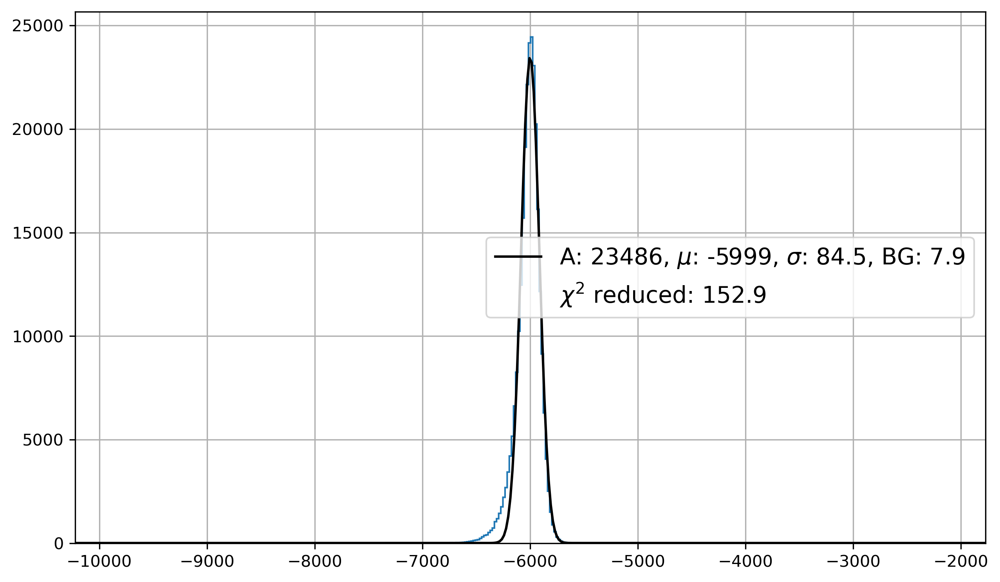

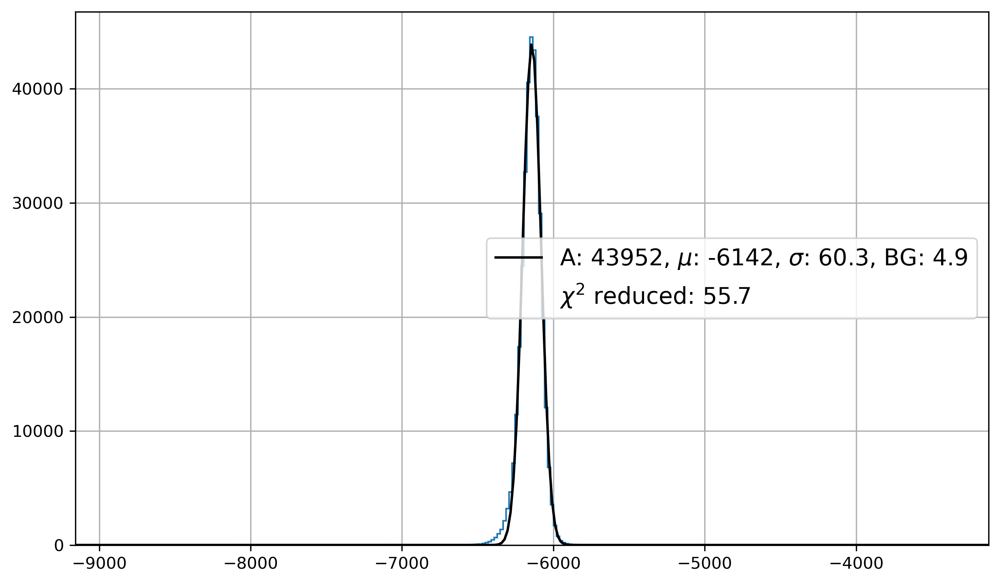

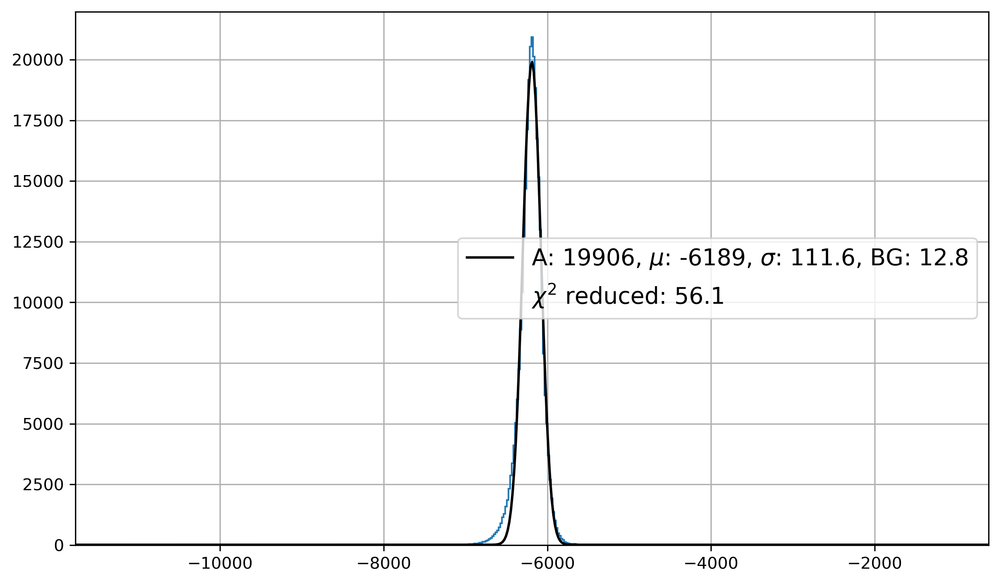

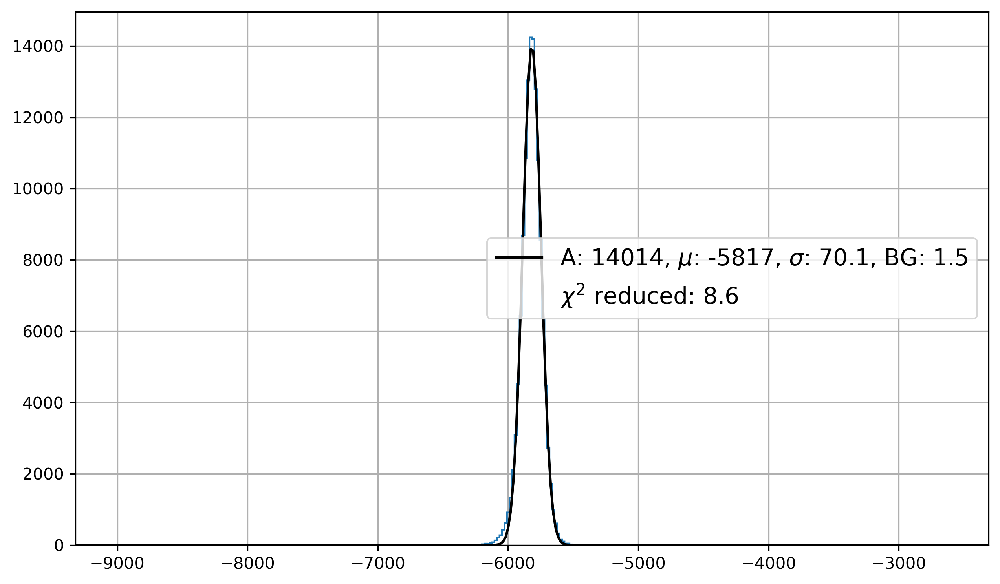

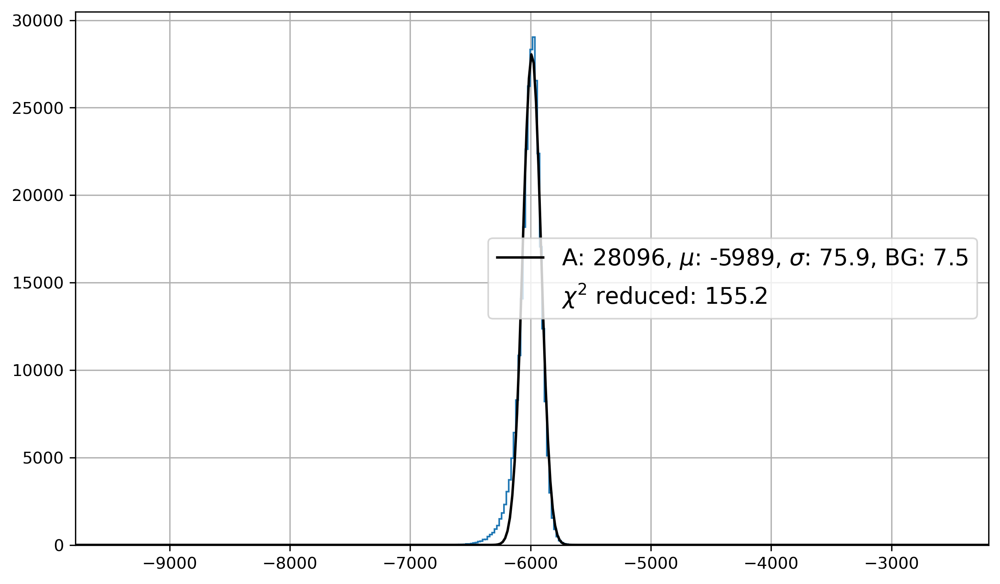

...

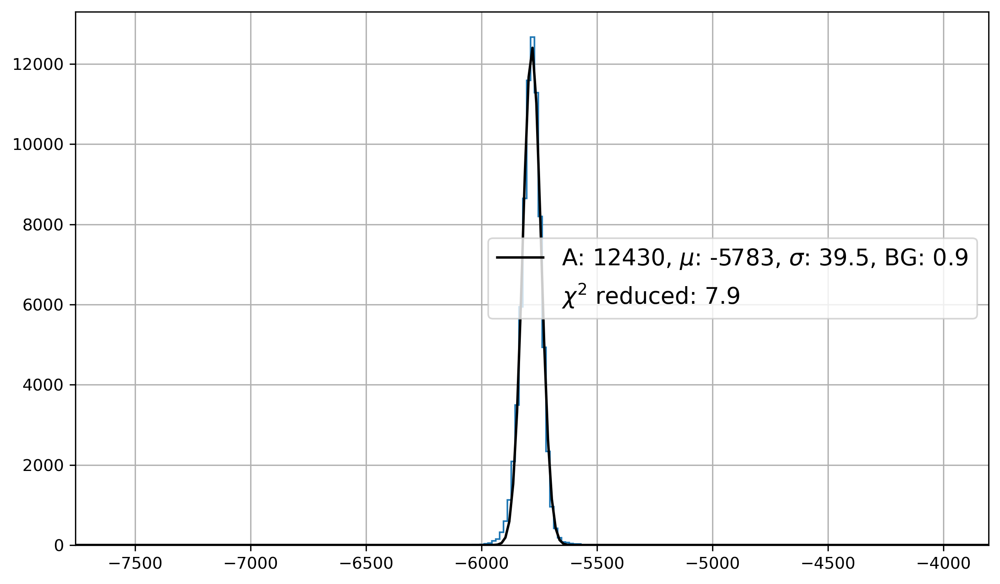

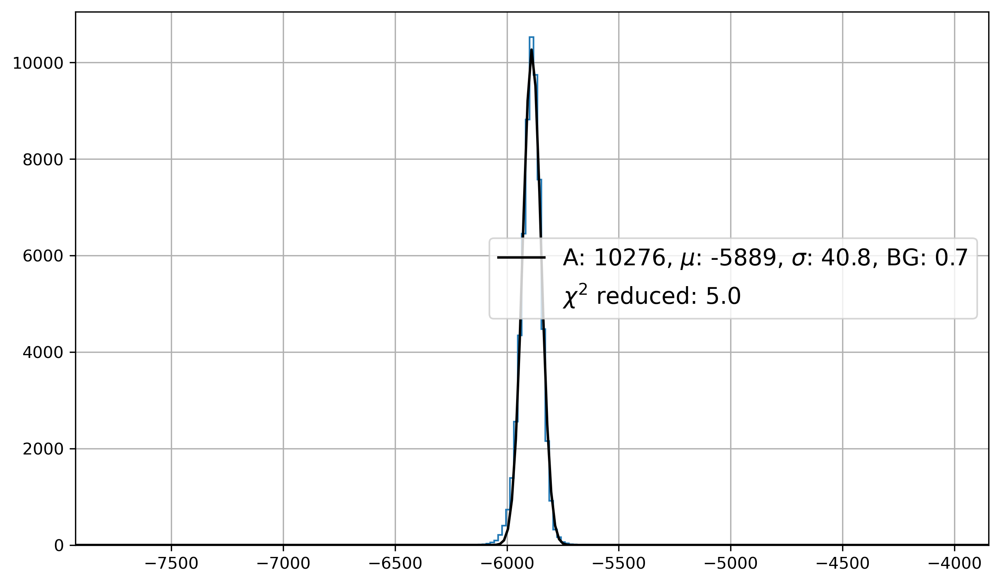

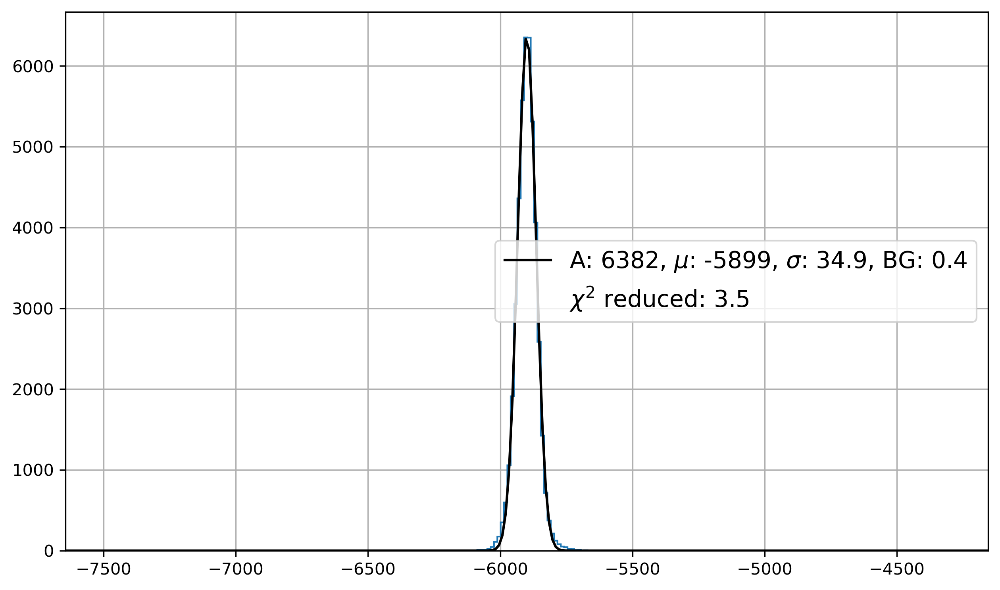

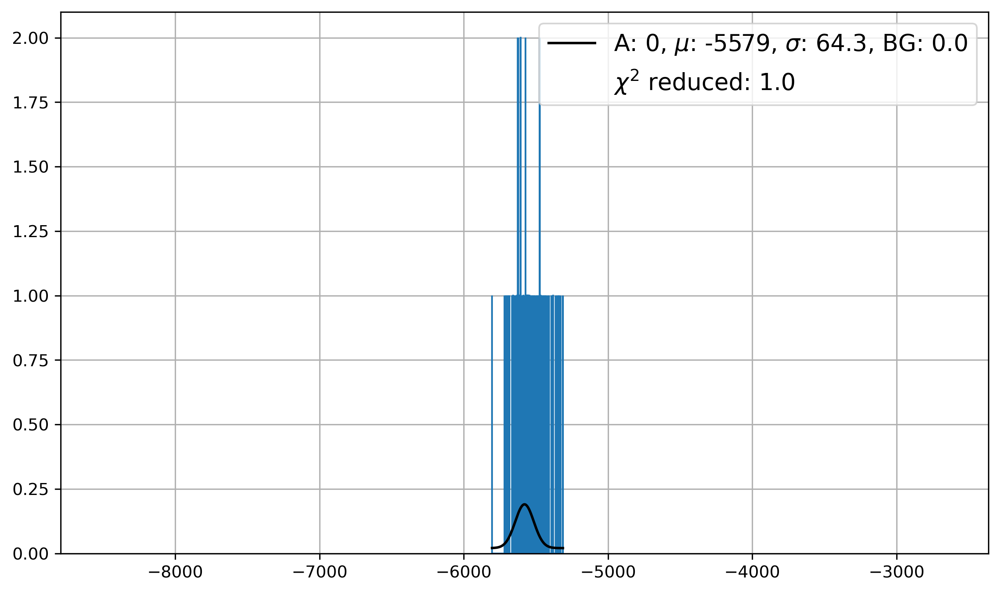

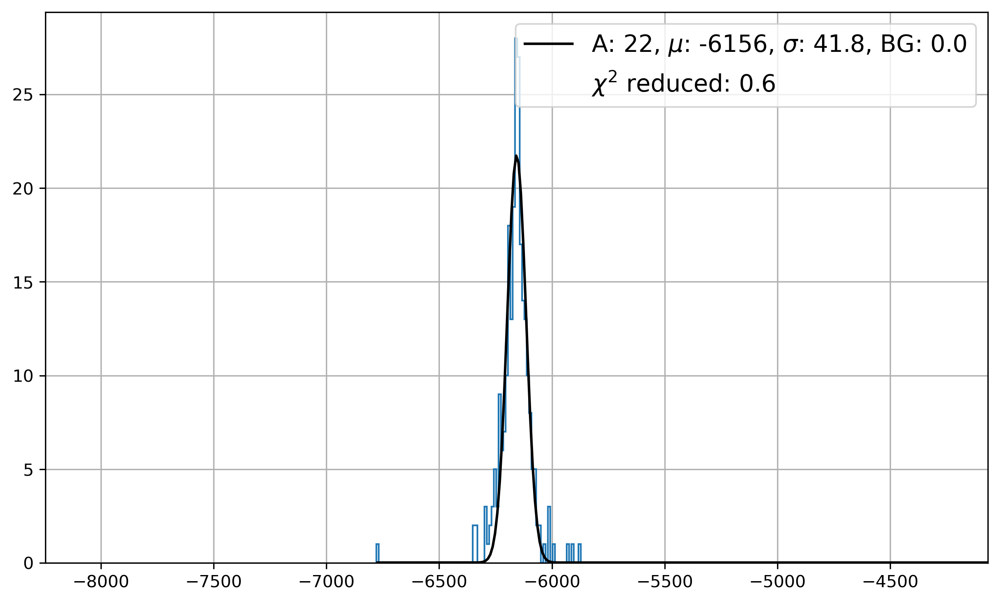

In [143]:

# SAVE = True
# save_path = f'../various plots/{this_sensor}/{key_to_study}/'
# if not os.path.isdir(save_path):
#     os.mkdir(save_path)

### I'm starting to think that putting the values in a list is not working
for this_batch in df_analysis.index.levels[0]: ### batches
    for S in df_analysis.index.levels[1]:        ### scopes
        ### get only the DUTs that I need
#         DUTs = get_DUT_from_index(list(df_analysis.loc[idx[this_batch,S,:]].index))
        df = load_batch(this_batch,S)
       
        print(f"MCP: {dict_of_batches[this_batch].S[S].channels['Ch1'].voltage} V, angle: {dict_of_batches[this_batch].angle}°", f"temperature:{dict_of_batches[this_batch].tempA}°C")
        print('channels:', df_analysis.loc[idx[this_batch,S,:]].index)
        for ch in df_analysis.loc[idx[this_batch,S,:]].index:      ### channels
            ### EXTRACTING DATA
            match ch:
                case 'Ch1': dut=-1
                case 'Ch2': dut=1
                case 'Ch3': dut=2
                case 'Ch4': dut=3
                case other: logging.error("wrong channel name")
            print(f"Batch:{this_batch}, Scope:{S}, Channel:{ch}")
#             comments = []
            ### should be a set:
            comments = set()
            geometry_cut = geometry_mask(df, DUT_number=dut, bins=bins_dict[this_batch], use='pulseheight')[0]
            if np.alltrue(geometry_cut):   ### this means the geometry_mask() failed 
                geometry_cut = geometry_mask(df, DUT_number=dut, bins=bins_dict[this_batch], use='time')[0]
                logging.info("using 'time' instead of 'pulseheight' for geometry_cut")
                comments.add("using time for geometry_cut")
                
            time_cut = time_mask(df, dut, bins=2000, mask=geometry_cut, plot=False)[0]
            
            mins = find_min_btw_peaks(df[f"pulseHeight_{dut}"], bins='rice', plot=False)
            pulseheight_cut = df[f'pulseHeight_{dut}']>mins
            if np.alltrue(pulseheight_cut==False):
                pulseheight_cut = pd.Series(True, index=df.index)
                logging.error("pulseHeight cut failed")
                comments.add("no pulseHeight cut")
                
            charge_cut = df[f'charge_{dut}']>threshold_charge
            all_cut = np.logical_and(np.logical_and(geometry_cut,pulseheight_cut),time_cut)
            
#             transimpedance = dict_of_batches[this_batch].S[S].get_sensor(ch).transimpedance
            transimpedance = 4700
    
            name = dict_of_batches[this_batch].S[S].get_sensor(ch).name
            board = dict_of_batches[this_batch].S[S].get_sensor(ch).board
            voltage = dict_of_batches[this_batch].S[S].get_sensor(ch).voltage
            MCP_voltage = dict_of_batches[this_batch].S[S].get_sensor('Ch1').voltage
            fluence = dict_of_batches[this_batch].S[S].get_sensor(ch).fluence
            temperature = dict_of_batches[this_batch].tempA
            angle = dict_of_batches[this_batch].angle
        
            try:
                charge_fit_file = f"charge_fit_results_{this_batch}_{S}_{dut}.csv"
                charge_fit_df = pd.read_csv(os.path.join(charge_fit_dir,charge_fit_file), skiprows=1)
                charge = charge_fit_df["MPV"].iloc[0]
                charge_error = charge_fit_df["MPV_error"].iloc[0]
            except FileNotFoundError:
                logging.error("Charge file not found")
                charge, charge_error = -1, 0
                comments.add("No charge fit file found")
            except:
                logging.error("Unknown error when loading charge fit")
                charge, charge_error = -1, 0
                comments.add("Charge fit error")
                                            
                ### I don't know if I should use only geo+pulse cut or all cuts
            try:
                time_parameters = time_mask(df, dut, bins=2000, mask=np.logical_and(np.logical_and(geometry_cut,pulseheight_cut),charge_cut), plot=True)[1]['parameters']
            except:
                logging.error("Time fit error")
                time_parameters = [0]*4
                comments.add("Time fit error")
        
            eff = efficiency(df[f"charge_{dut}"].loc[all_cut], threshold=4)
            
            match MCP_voltage:  ### last MCP_voltage entry
                case 2500: MCP_resolution = 36.52 # +/- 0.81
                case 2600: MCP_resolution = 16.48 # +/- 0.57
                case 2800: MCP_resolution = 3.73  # +/- 1.33
                case other: logging.error("Incorrect MCP voltage")

            time_resolution = np.sqrt(time_parameters[2]**2 - MCP_resolution**2)
            ### ADD FLUENCE          ['name', 'board', 'voltage', 'MCP_voltage', 'temperature', 'angle', 'fluence', 'charge', 'charge_error', 'efficiency', 'time_resolution', 'comments', 'exclude']
            df_analysis.loc[(this_batch,S,ch)] = [name, board, voltage, MCP_voltage, temperature, angle, fluence, charge, charge_error, eff, time_resolution, comments, False]

df_analysis = df_analysis.sort_values(by=['name','voltage'])
dict_analysis_IME[key_to_study] = df_analysis.copy()


In [11]:
# idx=pd.IndexSlice

### select one value from the index channel
# df_analysis.loc[idx[:,:,'Ch2'],['charge']] ### DATAFRAME  
# df_analysis.loc[idx[:,:,'Ch2']]['charge']  ### SERIES

display(df_analysis)

# dict_analysis_IME[key_to_study] = df_analysis.copy()

name   board voltage MCP_voltage  \
batch oscilloscope channel                                                 
205   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1    -125        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1    -125        2500   
206   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1    -100        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1    -100        2500   
411   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1    -125        2500   
413   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1    -125        2800   
414   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1    -100        2800   
411   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1    -125        2500   
413   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1    -125        2800   
414   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1    -100        2800   

                           temperature angle fluence   charge charge_error  \
batch oscilloscope channel                                                   
205   S1           Ch2           -28.1  13.0       0  44.9031     0.037022   
                   Ch3           -28.1  13.0       0  40.0835      0.08239   
206   S1           Ch2         -27.775  13.0       0   19.946     0.024194   
                   Ch3         -27.775  13.0       0  20.3101     0.029867   
411   S1           Ch4          -29.17  13.0       0  34.1758     0.050477   
413   S1           Ch4          -30.52   6.0       0  30.7195     0.026276   
414   S1           Ch4          -31.71   6.0       0  15.7474     0.011457   
411   S2           Ch4          -29.17  13.0       0  40.5912     0.053895   
413   S2           Ch4          -30.52   6.0       0  36.0466     0.035075   
414   S2           Ch4          -31.71   6.0       0  18.9706     0.017049   

                           efficiency time_resolution comments exclude  
batch oscilloscope channel                                              
205   S1           Ch2      99.909974       24.806418       {}   False  
                   Ch3      99.548119       56.894843       {}    True  
206   S1           Ch2      99.747309       37.766044       {}   False  
                   Ch3      99.709422       36.908098       {}   False  
411   S1           Ch4      99.764021       36.650979       {}   False  
413   S1           Ch4      99.901496       27.991848       {}   False  
414   S1           Ch4      99.767095       35.933999       {}   False  
411   S2           Ch4      99.808986         25.5708       {}   False  
413   S2           Ch4      99.897643       27.526322       {}   False  
414   S2           Ch4      99.666147       35.446937       {}   False

## Exclude the sensors that died or bad batches
Probably adding "exclude" or something to the comments

In [12]:
display(dict_analysis_IME["room_temp"])

,,,name,board,voltage,MCP_voltage,temperature,angle,fluence,charge,charge_error,efficiency,time_resolution,comments,exclude
batch,oscilloscope,channel,,,,,,,,,,,,,
408,S1,Ch4,IMEv3-W12-C3-1-4,CERN-1,-160,2500,21.366667,0.0,0,13.6665,0.030322,99.583945,44.124126,{},False
409,S1,Ch4,IMEv3-W12-C3-1-4,CERN-1,-160,2500,21.666667,0.0,0,13.6023,0.030987,99.50254,43.914603,{},False
410,S1,Ch4,IMEv3-W12-C3-1-4,CERN-1,-160,2600,21.7,0.0,0,13.5856,0.041473,99.571974,38.622733,{},False
408,S2,Ch4,IMEv3-W12-C3-1-5,CERN-1,-160,2500,21.366667,0.0,0,16.5143,0.022529,99.697575,35.211091,{},False
409,S2,Ch4,IMEv3-W12-C3-1-5,CERN-1,-160,2500,21.666667,0.0,0,16.4091,0.022097,99.625106,35.870241,{},False
410,S2,Ch4,IMEv3-W12-C3-1-5,CERN-1,-160,2600,21.7,0.0,0,16.4721,0.029598,99.604447,36.534757,{},False
301,S2,Ch4,IMEv3-W12-C3-1-5,CERN-1,-100,2500,21.733333,0.0,0,7.60955,0.010607,99.658032,62.261594,{},False


In [53]:
### 100 and 101 have too little data (in the dead columns of pixels of the MIMOSA planes)
dict_analysis_IME["normal_2500"].loc[(100,'S1','Ch2')]['exclude'] = True
dict_analysis_IME["normal_2500"].loc[(100,'S1','Ch3')]['exclude'] = True
dict_analysis_IME["normal_2500"].loc[(100,'S1','Ch4')]['exclude'] = True
dict_analysis_IME["normal_2500"].loc[(100,'S2','Ch4')]['exclude'] = True

dict_analysis_IME["normal_2500"].loc[(101,'S1','Ch2')]['exclude'] = True
dict_analysis_IME["normal_2500"].loc[(101,'S1','Ch3')]['exclude'] = True
dict_analysis_IME["normal_2500"].loc[(101,'S1','Ch4')]['exclude'] = True
dict_analysis_IME["normal_2500"].loc[(101,'S2','Ch4')]['exclude'] = True

display(dict_analysis_IME["normal_2500"])

name   board voltage MCP_voltage  \
batch oscilloscope channel                                                 
204   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1    -125        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1    -125        2500   
203   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1    -100        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1    -100        2500   
202   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1     -90        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1     -90        2500   
101   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1     -80        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1     -80        2500   
201   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1     -80        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1     -80        2500   
100   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1     -70        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1     -70        2500   
407   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1    -125        2500   
403   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1    -100        2500   
402   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1     -90        2500   
101   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1     -80        2500   
401   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1     -80        2500   
100   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1     -70        2500   
407   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1    -125        2500   
403   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1    -100        2500   
402   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1     -90        2500   
101   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1     -80        2500   
401   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1     -80        2500   
100   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1     -70        2500   

                           temperature angle fluence   charge charge_error  \
batch oscilloscope channel                                                   
204   S1           Ch2      -30.033333   0.0       0  46.9246     0.070395   
                   Ch3      -30.033333   0.0       0  41.1179     0.188674   
203   S1           Ch2      -32.333333   0.0       0  19.6674     0.020444   
                   Ch3      -32.333333   0.0       0  19.4922     0.027674   
202   S1           Ch2         -32.225   0.0       0  16.3929     0.014958   
                   Ch3         -32.225   0.0       0  16.5044     0.019725   
101   S1           Ch2           -33.3   0.0       0  13.7236     0.171916   
                   Ch3           -33.3   0.0       0  14.3682     0.202705   
201   S1           Ch2      -31.333333   0.0       0  13.9691     0.014094   
                   Ch3      -31.333333   0.0       0  14.2502     0.018609   
100   S1           Ch2          -32.84   0.0       0  12.3916      0.06952   
                   Ch3          -32.84   0.0       0  12.8985     0.077528   
407   S1           Ch4          -29.81   0.0       0  29.6587     0.031711   
403   S1           Ch4          -30.45   0.0       0  15.4815     0.017194   
402   S1           Ch4      -29.377778   0.0       0  12.9276     0.012729   
101   S1           Ch4           -33.3   0.0       0  11.9036     0.096394   
401   S1           Ch4      -30.555556   0.0       0  11.3919     0.010685   
100   S1           Ch4          -32.84   0.0       0   10.467     0.038588   
407   S2           Ch4          -29.81   0.0       0   35.329     0.021756   
403   S2           Ch4          -30.45   0.0       0  18.5584     0.017053   
402   S2           Ch4      -29.377778   0.0       0  15.4473     0.013087   
101   S2           Ch4           -33.3   0.0       0  14.2575      0.09876   
401   S2           Ch4      -30.555556   0.0       0  13.5955     0.010732   
100   S2           Ch4          -32.84   0.0       0  12.5733     0.037672   

                           efficie

In [14]:
# display(dict_analysis_IME["irradiated_2800"])
dict_analysis_IME["irradiated_2800"].loc[(504,'S1','Ch4')]['exclude'] = True  ### sensor died (weird time vs pulseheight)
dict_analysis_IME["irradiated_2800"].loc[(505,'S1','Ch4')]['exclude'] = True  ###       "      " 

dict_analysis_IME["irradiated_2800"].loc[(501,'S1','Ch2')]['exclude'] = True
dict_analysis_IME["irradiated_2800"].loc[(502,'S1','Ch2')]['exclude'] = True

dict_analysis_IME["irradiated_2800"].loc[(505,'S2','Ch2')]['exclude'] = True

dict_analysis_IME["irradiated_2800"].loc[(601,'S2','Ch4')]['exclude'] = True
dict_analysis_IME["irradiated_2800"].loc[(602,'S2','Ch4')]['exclude'] = True
dict_analysis_IME["irradiated_2800"].loc[(603,'S2','Ch4')]['exclude'] = True
dict_analysis_IME["irradiated_2800"].loc[(604,'S2','Ch4')]['exclude'] = True
dict_analysis_IME["irradiated_2800"].loc[(605,'S2','Ch4')]['exclude'] = True

### pad cut out of the ROI
dict_analysis_IME["irradiated_2800"].loc[(601,'S2','Ch2')]['exclude'] = True
dict_analysis_IME["irradiated_2800"].loc[(602,'S2','Ch2')]['exclude'] = True
dict_analysis_IME["irradiated_2800"].loc[(603,'S2','Ch2')]['exclude'] = True
dict_analysis_IME["irradiated_2800"].loc[(604,'S2','Ch2')]['exclude'] = True
dict_analysis_IME["irradiated_2800"].loc[(605,'S2','Ch2')]['exclude'] = True

display(dict_analysis_IME["irradiated_2800"])


,,,name,board,voltage,MCP_voltage,temperature,angle,fluence,charge,charge_error,efficiency,time_resolution,comments,exclude
batch,oscilloscope,channel,,,,,,,,,,,,,
605,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-490,2800,-30.6875,0.0,1.50E+15,16.4246,0.029604,98.683844,39.363004,{},False
604,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-450,2800,-30.8,0.0,1.50E+15,12.2496,0.013435,98.870137,34.777494,{},False
603,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-400,2800,-30.675,0.0,1.50E+15,8.66278,0.010897,98.89898,38.815257,{},False
602,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-350,2800,-30.45,0.0,1.50E+15,6.04218,0.011451,98.824063,45.034472,{},False
601,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-300,2800,-30.625,0.0,1.50E+15,4.34754,0.004996,98.725826,52.232174,{},False
605,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-490,2800,-30.6875,0.0,1.50E+15,17.125,0.034896,98.810147,40.647798,{},False
604,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-450,2800,-30.8,0.0,1.50E+15,12.7577,0.015633,99.008793,35.522571,{},False
603,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-400,2800,-30.675,0.0,1.50E+15,9.08768,0.012988,99.090466,38.814198,{},False
602,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-350,2800,-30.45,0.0,1.50E+15,6.36508,0.014092,98.950837,44.923265,{},False


In [11]:
dict_analysis_IME["angled"].loc[(205,'S1','Ch3')]['exclude'] = True

display(dict_analysis_IME['angled'])

name   board voltage MCP_voltage  \
batch oscilloscope channel                                                 
205   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1    -125        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1    -125        2500   
206   S1           Ch2      IMEv3-W12-C2-2-2  CERN-1    -100        2500   
                   Ch3      IMEv3-W12-C2-2-2  CERN-1    -100        2500   
411   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1    -125        2500   
413   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1    -125        2800   
414   S1           Ch4      IMEv3-W12-C3-1-4  CERN-1    -100        2800   
411   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1    -125        2500   
413   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1    -125        2800   
414   S2           Ch4      IMEv3-W12-C3-1-5  CERN-1    -100        2800   

                           temperature angle fluence   charge charge_error  \
batch oscilloscope channel                                                   
205   S1           Ch2           -28.1  13.0       0  44.9031     0.037022   
                   Ch3           -28.1  13.0       0  40.0835      0.08239   
206   S1           Ch2         -27.775  13.0       0   19.946     0.024194   
                   Ch3         -27.775  13.0       0  20.3101     0.029867   
411   S1           Ch4          -29.17  13.0       0  34.1758     0.050477   
413   S1           Ch4          -30.52   6.0       0  30.7195     0.026276   
414   S1           Ch4          -31.71   6.0       0  15.7474     0.011457   
411   S2           Ch4          -29.17  13.0       0  40.5912     0.053895   
413   S2           Ch4          -30.52   6.0       0  36.0466     0.035075   
414   S2           Ch4          -31.71   6.0       0  18.9706     0.017049   

                           efficiency time_resolution comments exclude  
batch oscilloscope channel                                              
205   S1           Ch2      99.909974       24.806418       {}   False  
                   Ch3      99.548119       56.894843       {}    True  
206   S1           Ch2      99.747309       37.766044       {}   False  
                   Ch3      99.709422       36.908098       {}   False  
411   S1           Ch4      99.764021       36.650979       {}   False  
413   S1           Ch4      99.901496       27.991848       {}   False  
414   S1           Ch4      99.767095       35.933999       {}   False  
411   S2           Ch4      99.808986         25.5708       {}   False  
413   S2           Ch4      99.897643       27.526322       {}   False  
414   S2           Ch4      99.666147       35.446937       {}   False

In [13]:
dict_analysis_IME["angled_irradiated"].loc[(702,'S2','Ch4')]['exclude'] = True
dict_analysis_IME["angled_irradiated"].loc[(1001,'S2','Ch4')]['exclude'] = True
dict_analysis_IME["angled_irradiated"].loc[(1002,'S2','Ch4')]['exclude'] = True
dict_analysis_IME["angled_irradiated"].loc[(1101,'S2','Ch3')]['exclude'] = True

display(dict_analysis_IME['angled_irradiated'])

,,,name,board,voltage,MCP_voltage,temperature,angle,fluence,charge,charge_error,efficiency,time_resolution,comments,exclude
batch,oscilloscope,channel,,,,,,,,,,,,,
701,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-490,2800,-31.025,14.0,1.50E+15,19.5741,0.018504,98.881635,37.032307,{},False
1001,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-490,2800,-31.2125,6.0,1.50E+15,18.5379,0.024486,98.947691,38.036739,{},False
702,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-450,2800,-30.75,14.0,1.50E+15,14.0518,0.016907,98.910538,33.908942,{},False
1002,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-450,2800,-31.3,6.0,1.50E+15,13.7691,0.015983,98.983794,34.769535,{},False
701,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-490,2800,-31.025,14.0,1.50E+15,20.3396,0.024819,99.153476,37.774231,{},False
1001,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-490,2800,-31.2125,6.0,1.50E+15,19.3114,0.034313,99.102089,38.915835,{},False
702,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-450,2800,-30.75,14.0,1.50E+15,14.7071,0.023252,99.252091,34.375987,{},False
1002,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-450,2800,-31.3,6.0,1.50E+15,14.4003,0.022468,99.091174,35.19322,{},False
701,S1,Ch4,CERN2-CH2-IMEv3-W12,CERN2,-490,2800,-31.025,14.0,1.50E+15,17.5374,0.018938,98.60526,33.416267,{},False


## Save the data
save the dictionary of dataframes


In [54]:
with open(IME_file_name, 'wb') as f:
    pickle.dump(dict_analysis_IME, f)

## Plots

In [15]:
def update_prop(handle, orig):
    handle.update_from(orig)
    handle.set_marker("")

In [16]:
markers = ('o','v','s','*','X','P','D','2')
colormap = ['k','b','g','r','orange','yellow','purple']

### Putting plots together

In [30]:
### maybe these could all be colormaps
IME_color_map = { 'IMEv3-W12-C2-2-2':[colormaps["tab20b"](0), colormaps["tab20b"](0.1)], # there are two of these!
 'IMEv3-W12-C3-1-4':[colormaps["tab20b"](0.6)],
 'IMEv3-W12-C3-1-5':[colormaps["tab20b"](.7)],
 'CERN2-CH0-IMEv3-W12':[colormaps["Blues"](.4)],
 'CERN2-CH1-IMEv3-W12':[colormaps["Blues"](.6)],
 'CERN2-CH2-IMEv3-W12':[colormaps["Blues"](.9)],
 'CERN2-CH4-IMEv3-W16':['yellow'],
 'JSI-B7-IMEv3-W16-8E14':['orange'],  
 'JSI-B13-IMEv3-W16-2.5E15':['r'],
 'JSI-B6-IMEv2-W7-1E14':['fuchsia'],
 'JSI-PP4-IMEv2-W7-6.5E14':['purple']
}

In [18]:
# dict_analysis_IME.keys()

## Room temperature

In [68]:
### maybe this doesn't make sense because I need different labels depending on which plots I compare
labels_for_keys = {'normal_2500':'-30°C',
                   'room_temp':'20°C',
#                    'irradiated_2800':'irradiated',
#                    'angled':'angled',
#                    'angled_irradiated': 'angled and irradiated'
                  }

### Charge

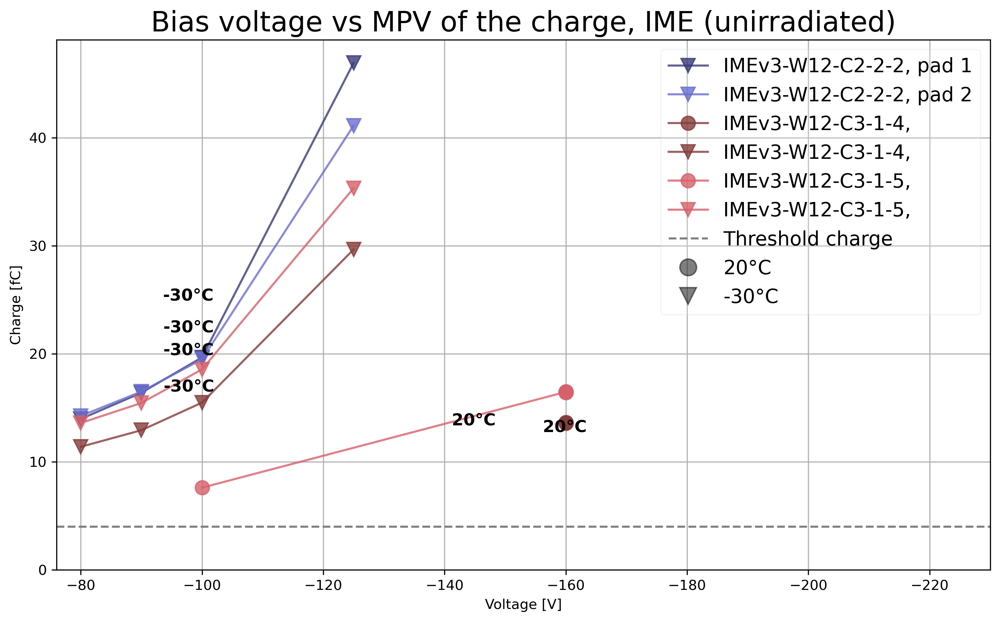

In [69]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)

fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['room_temp', 'normal_2500']

list_of_texts = []
for i,sensor_name in enumerate(IME_names):
#     print(sensor_name)
    for j,key in enumerate(keys_to_plot):#, 'irradiated_2800']):#, 'angled', 'angled_irradiated']):
#         print(key)
        df_analysis = dict_analysis_IME[key]
        df_analysis = df_analysis.loc[df_analysis['exclude']==False]
        df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
            charge = np.array(df_analysis.loc[idx[:,:,ch]]['charge'])
            batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, charge,
                    marker=markers[j], markersize=10, alpha=0.8, color=IME_color_map[sensor_name][k],  ### colors are fucked up
                    label=f"{sensor_name}, {pads[k]}")
        ### labels for all the batches
#             for x,y,label in zip(voltage,charge,batch_labels):
#                 list_of_texts.append(ax.text(x, y, label))
        ### labels for all the keys to study
            list_of_texts.append(ax.text(np.mean(voltage[:]), np.mean(charge[:]), labels_for_keys[key],
                                         fontsize='large', weight='bold'))
    
ax.axhline(threshold_charge, linestyle='--', color='grey', label="Threshold charge")

ax.set_title(f"Bias voltage vs MPV of the charge, IME (unirradiated)", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Charge [fC]")
ax.set_ylim(0,None)
ax.set_xlim(-230,None)
ax.invert_xaxis()

ax.grid('--')
# leg = ax.legend(fontsize=14, handler_map={plt.Line2D:HandlerLine2D(update_func=update_prop)})
# leg.get_lines
for j,key in enumerate(keys_to_plot):
    ax.plot([],[], marker=markers[j], markersize=12, color='k', linewidth=0, alpha=0.5,
            label=labels_for_keys[key])

ax.legend(fontsize=14, framealpha=0.2)
adjust_text(list_of_texts)

### Time resolution

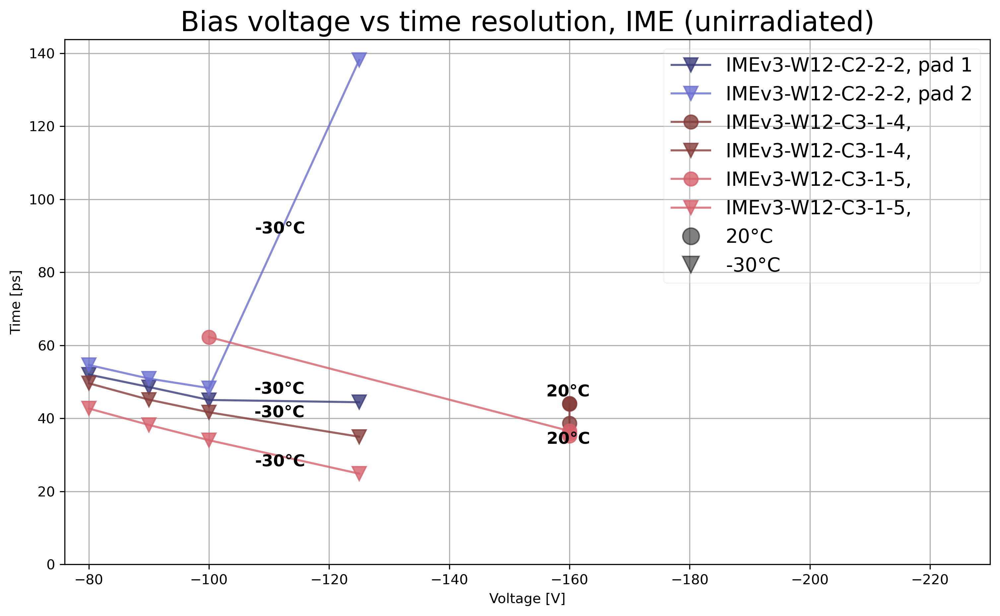

In [70]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)

fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['room_temp', 'normal_2500']

list_of_texts = []
for i,sensor_name in enumerate(IME_names):
#     print(sensor_name)
    for j,key in enumerate(keys_to_plot):#, 'irradiated_2800']):#, 'angled', 'angled_irradiated']):
#         print(key)
        df_analysis = dict_analysis_IME[key]
        df_analysis = df_analysis.loc[df_analysis['exclude']==False]
        df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
            charge = np.array(df_analysis.loc[idx[:,:,ch]]['time_resolution'])
            batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, charge,
                    marker=markers[j], markersize=10, alpha=0.8, color=IME_color_map[sensor_name][k],  ### colors are fucked up
                    label=f"{sensor_name}, {pads[k]}")
        ### labels for all the batches
#             for x,y,label in zip(voltage,charge,batch_labels):
#                 list_of_texts.append(ax.text(x, y, label))
        ### labels for all the keys to study
            list_of_texts.append(ax.text(np.mean(voltage[0:2]), np.mean(charge[0:2]), labels_for_keys[key],
                                         fontsize='large', weight='bold'))
    
# ax.axhline(threshold_charge, linestyle='--', color='grey', label="Threshold charge")

ax.set_title(f"Bias voltage vs time resolution, IME (unirradiated)", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Time [ps]")
ax.set_ylim(0,None)
ax.set_xlim(-230,None)
ax.invert_xaxis()

ax.grid('--')
# leg = ax.legend(fontsize=14, handler_map={plt.Line2D:HandlerLine2D(update_func=update_prop)})
# leg.get_lines
for j,key in enumerate(keys_to_plot):
    ax.plot([],[], marker=markers[j], markersize=12, color='k', linewidth=0, alpha=0.5,
            label=labels_for_keys[key])

ax.legend(fontsize=14, framealpha=0.2)
adjust_text(list_of_texts)

### Efficiency

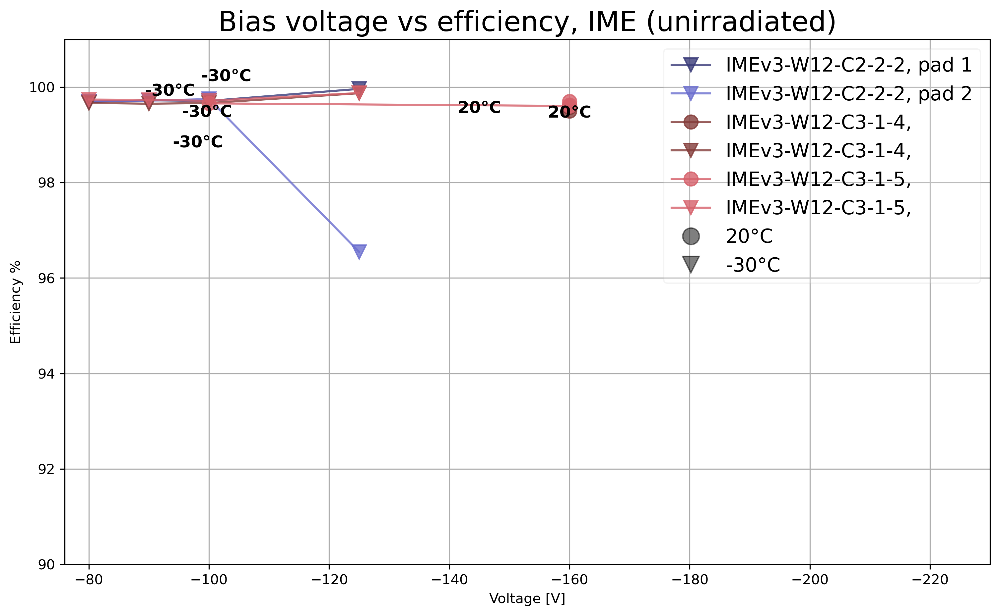

In [73]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)

fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['room_temp', 'normal_2500']

list_of_texts = []
for i,sensor_name in enumerate(IME_names):
#     print(sensor_name)
    for j,key in enumerate(keys_to_plot):#, 'irradiated_2800']):#, 'angled', 'angled_irradiated']):
#         print(key)
        df_analysis = dict_analysis_IME[key]
        df_analysis = df_analysis.loc[df_analysis['exclude']==False]
        df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
            charge = np.array(df_analysis.loc[idx[:,:,ch]]['efficiency'])
            batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, charge,
                    marker=markers[j], markersize=10, alpha=0.8, color=IME_color_map[sensor_name][k],  ### colors are fucked up
                    label=f"{sensor_name}, {pads[k]}")
        ### labels for all the batches
#             for x,y,label in zip(voltage,charge,batch_labels):
#                 list_of_texts.append(ax.text(x, y, label))
        ### labels for all the keys to study
            list_of_texts.append(ax.text(np.mean(voltage[:]), np.mean(charge[:]), labels_for_keys[key],
                                         fontsize='large', weight='bold'))
    
# ax.axhline(threshold_charge, linestyle='--', color='grey', label="Threshold charge")

ax.set_title(f"Bias voltage vs efficiency, IME (unirradiated)", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Efficiency %")
ax.set_ylim(90,101)
ax.set_xlim(-230,None)
ax.invert_xaxis()

ax.grid('--')
# leg = ax.legend(fontsize=14, handler_map={plt.Line2D:HandlerLine2D(update_func=update_prop)})
# leg.get_lines
for j,key in enumerate(keys_to_plot):
    ax.plot([],[], marker=markers[j], markersize=12, color='k', linewidth=0, alpha=0.5,
            label=labels_for_keys[key])

ax.legend(fontsize=14, framealpha=0.2)
adjust_text(list_of_texts)

## Angled

In [76]:
labels_for_keys = {'normal_2500':'0°',
#                    'room_temp':'20°C',
#                    'irradiated_2800':'irradiated',
                   'angled':'angled',
#                    'angled_irradiated': 'angled and irradiated'
                  }

### Charge

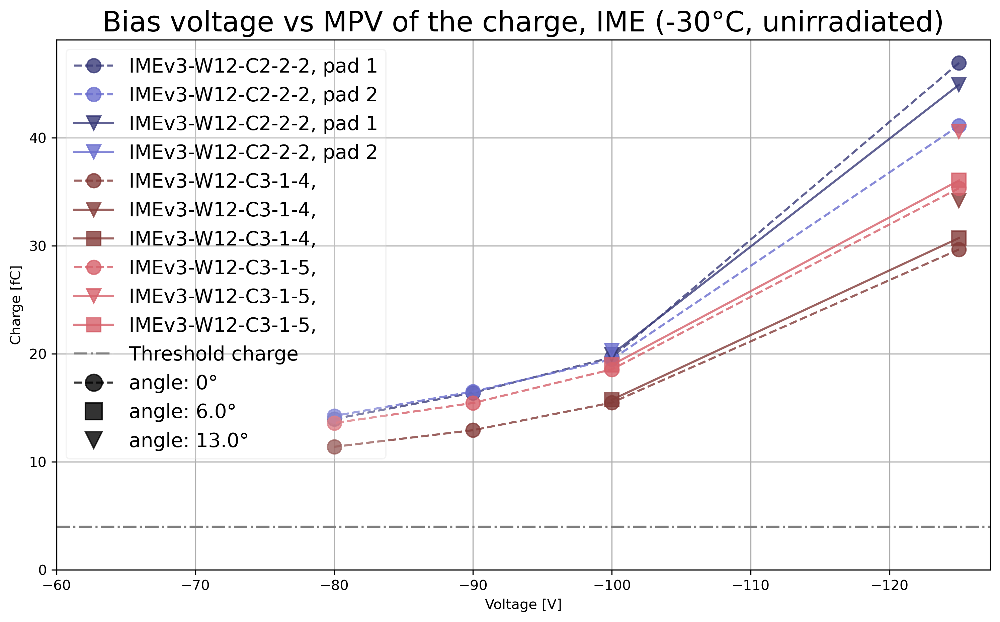

In [77]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)

fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['normal_2500', 'angled']

list_of_texts = []
unique_list = []

for i,sensor_name in enumerate(IME_names):
    j = 0
    key = keys_to_plot[j]
    df_analysis = dict_analysis_IME[key]
    df_analysis = df_analysis.loc[df_analysis['exclude']==False]
    df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

    for k,ch in enumerate(df_analysis.index.unique(2)):
        voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
        charge = np.array(df_analysis.loc[idx[:,:,ch]]['charge'])
        batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
        if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
        else:    pads = ['']
        ax.plot(voltage, charge,
                marker=markers[j], markersize=10, alpha=0.8, color=IME_color_map[sensor_name][k], linestyle='--',  ### colors are fucked up
                label=f"{sensor_name}, {pads[k]}")
    ### labels for all the batches
#         for x,y,label in zip(voltage,charge,batch_labels):
#             list_of_texts.append(ax.text(x, y, label))
    ### labels for all the keys to study
#         list_of_texts.append(ax.text(np.mean(voltage[:]), np.mean(charge[:]), labels_for_keys[key],
#                                      fontsize='large', weight='bold'))      
    j = 1
    key = keys_to_plot[j]
    df_analysis = dict_analysis_IME[key]
    df_analysis = df_analysis.loc[df_analysis['exclude']==False]
    df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]
    for a,this_angle in enumerate(df_analysis['angle'].unique()):
        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[idx[:,:,ch]]['voltage'])
            charge = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[idx[:,:,ch]]['charge'])
            batch_labels = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, charge,
                    marker=markers[j+a], markersize=10, alpha=0.8, color=IME_color_map[sensor_name][k],  ### colors are fucked up
                    label=f"{sensor_name}, {pads[k]}")
            if this_angle not in unique_list:
                ax.plot([],[], marker=markers[1+a], markersize=12, color='k', linewidth=0, alpha=0.8,
                        label=f"angle: {this_angle}°")
                unique_list.append(this_angle)

#             for x,y,label in zip(voltage,charge,batch_labels):
#                 list_of_texts.append(ax.text(x, y, label))

ax.plot([],[], marker=markers[0], markersize=12, color='k', alpha=0.8, linestyle='--',
        label="angle: 0°")


ax.axhline(threshold_charge, linestyle='-.', color='grey', label="Threshold charge")

ax.set_title(f"Bias voltage vs MPV of the charge, IME (-30°C, unirradiated)", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Charge [fC]")
ax.set_ylim(0,None)
ax.set_xlim(None,-60)
ax.invert_xaxis()

ax.grid('--')


#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

#specify order of items in legend
order = [0,1,2,4,5,6,7,9,10,11,13,12,8,3]

#add legend to plot
ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order],fontsize=14, framealpha=0.2, loc='upper left')

adjust_text(list_of_texts)

### Time Resolution

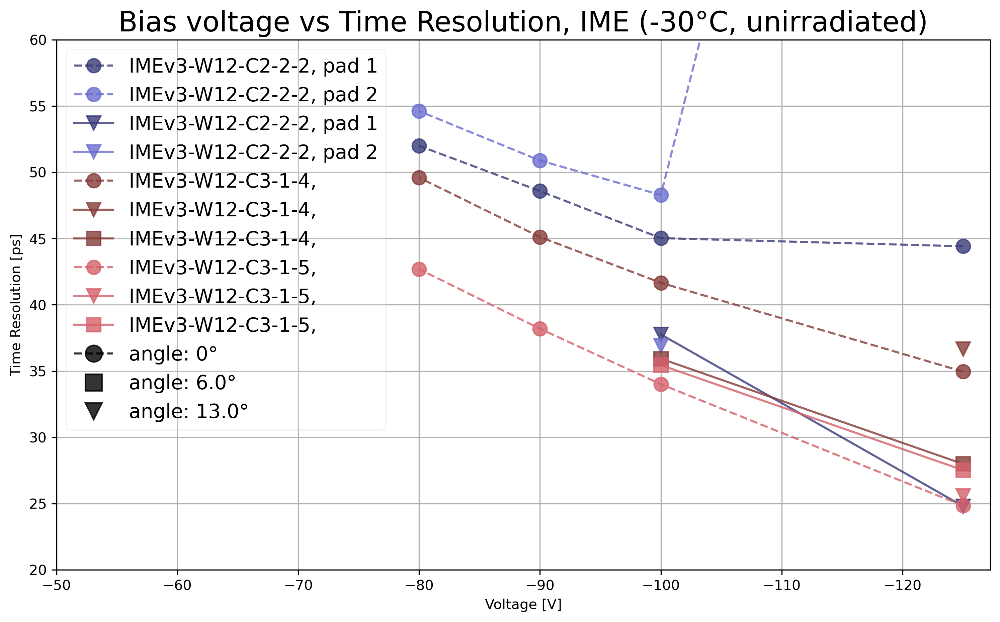

In [86]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)

fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['normal_2500', 'angled']

list_of_texts = []
unique_list = []

for i,sensor_name in enumerate(IME_names):
    j = 0
    key = keys_to_plot[j]
    df_analysis = dict_analysis_IME[key]
    df_analysis = df_analysis.loc[df_analysis['exclude']==False]
    df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

    for k,ch in enumerate(df_analysis.index.unique(2)):
        voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
        charge = np.array(df_analysis.loc[idx[:,:,ch]]['time_resolution'])
        batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
        if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
        else:    pads = ['']
        ax.plot(voltage, charge,
                marker=markers[j], markersize=10, alpha=0.8, color=IME_color_map[sensor_name][k], linestyle='--',  ### colors are fucked up
                label=f"{sensor_name}, {pads[k]}")
    ### labels for all the batches
#         for x,y,label in zip(voltage,charge,batch_labels):
#             list_of_texts.append(ax.text(x, y, label))
    ### labels for all the keys to study
#         list_of_texts.append(ax.text(np.mean(voltage[:]), np.mean(charge[:]), labels_for_keys[key],
#                                      fontsize='large', weight='bold'))      
    j = 1
    key = keys_to_plot[j]
    df_analysis = dict_analysis_IME[key]
    df_analysis = df_analysis.loc[df_analysis['exclude']==False]
    df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]
    for a,this_angle in enumerate(df_analysis['angle'].unique()):
        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[idx[:,:,ch]]['voltage'])
            charge = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[idx[:,:,ch]]['time_resolution'])
            batch_labels = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, charge,
                    marker=markers[j+a], markersize=10, alpha=0.8, color=IME_color_map[sensor_name][k],  ### colors are fucked up
                    label=f"{sensor_name}, {pads[k]}")
            if this_angle not in unique_list:
                ax.plot([],[], marker=markers[1+a], markersize=12, color='k', linewidth=0, alpha=0.8,
                        label=f"angle: {this_angle}°")
                unique_list.append(this_angle)

#             for x,y,label in zip(voltage,charge,batch_labels):
#                 list_of_texts.append(ax.text(x, y, label))

ax.plot([],[], marker=markers[0], markersize=12, color='k', alpha=0.8, linestyle='--',
        label="angle: 0°")


# ax.axhline(threshold_charge, linestyle='-.', color='grey', label="Threshold charge")

ax.set_title(f"Bias voltage vs Time Resolution, IME (-30°C, unirradiated)", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Time Resolution [ps]")
ax.set_ylim(20,60)
ax.set_xlim(None,-50)
ax.invert_xaxis()

ax.grid('--')


#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

#specify order of items in legend
order = [0,1,2,4,5,6,7,9,10,11,12,8,3]

#add legend to plot
ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order],fontsize=14, framealpha=0.2, loc='upper left')
adjust_text(list_of_texts)

### Efficiency

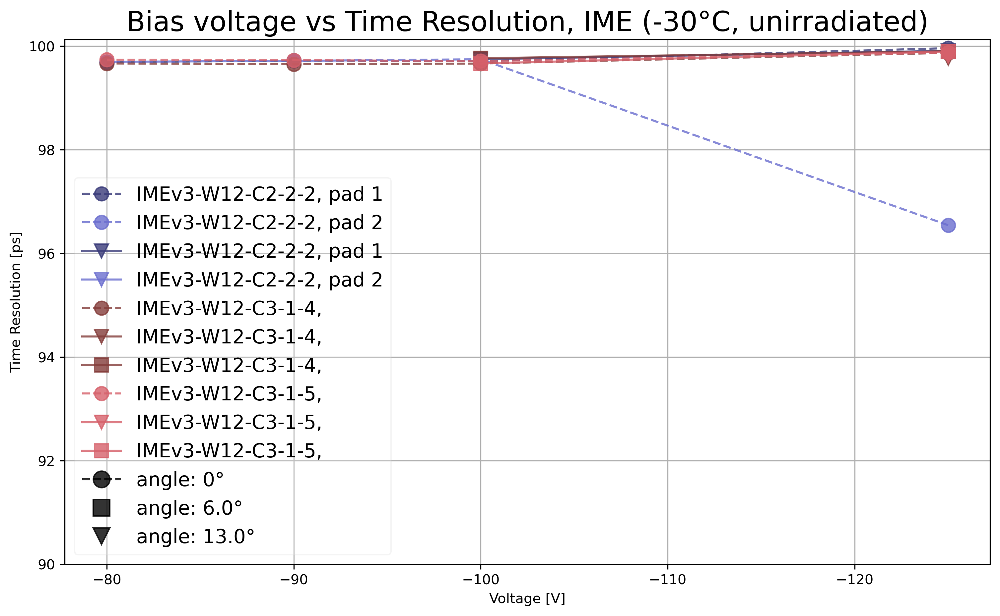

In [90]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)

fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['normal_2500', 'angled']

list_of_texts = []
unique_list = []

for i,sensor_name in enumerate(IME_names):
    j = 0
    key = keys_to_plot[j]
    df_analysis = dict_analysis_IME[key]
    df_analysis = df_analysis.loc[df_analysis['exclude']==False]
    df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

    for k,ch in enumerate(df_analysis.index.unique(2)):
        voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
        charge = np.array(df_analysis.loc[idx[:,:,ch]]['efficiency'])
        batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
        if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
        else:    pads = ['']
        ax.plot(voltage, charge,
                marker=markers[j], markersize=10, alpha=0.8, color=IME_color_map[sensor_name][k], linestyle='--',  ### colors are fucked up
                label=f"{sensor_name}, {pads[k]}")
    ### labels for all the batches
#         for x,y,label in zip(voltage,charge,batch_labels):
#             list_of_texts.append(ax.text(x, y, label))
    ### labels for all the keys to study
#         list_of_texts.append(ax.text(np.mean(voltage[:]), np.mean(charge[:]), labels_for_keys[key],
#                                      fontsize='large', weight='bold'))      
    j = 1
    key = keys_to_plot[j]
    df_analysis = dict_analysis_IME[key]
    df_analysis = df_analysis.loc[df_analysis['exclude']==False]
    df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]
    for a,this_angle in enumerate(df_analysis['angle'].unique()):
        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[idx[:,:,ch]]['voltage'])
            charge = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[idx[:,:,ch]]['efficiency'])
            batch_labels = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, charge,
                    marker=markers[j+a], markersize=10, alpha=0.8, color=IME_color_map[sensor_name][k],  ### colors are fucked up
                    label=f"{sensor_name}, {pads[k]}")
            if this_angle not in unique_list:
                ax.plot([],[], marker=markers[1+a], markersize=12, color='k', linewidth=0, alpha=0.8,
                        label=f"angle: {this_angle}°")
                unique_list.append(this_angle)

#             for x,y,label in zip(voltage,charge,batch_labels):
#                 list_of_texts.append(ax.text(x, y, label))

ax.plot([],[], marker=markers[0], markersize=12, color='k', alpha=0.8, linestyle='--',
        label="angle: 0°")


# ax.axhline(threshold_charge, linestyle='-.', color='grey', label="Threshold charge")

ax.set_title(f"Bias voltage vs Time Resolution, IME (-30°C, unirradiated)", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Time Resolution [ps]")
ax.set_ylim(90,None)
# ax.set_xlim(None,-50)
ax.invert_xaxis()

ax.grid('--')


#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

#specify order of items in legend
order = [0,1,2,4,5,6,7,9,10,11,12,8,3]

#add legend to plot
ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order],fontsize=14, framealpha=0.2, loc='lower left')
adjust_text(list_of_texts)

## Irradiated

In [92]:
labels_for_keys = {'normal_2500':'unirr.',
                   'room_temp':'20°C',
                   'irradiated_2800':'irradiated',
                   'angled':'angled',
                   'angled_irradiated': 'angled and irradiated'
                  }

### Charge

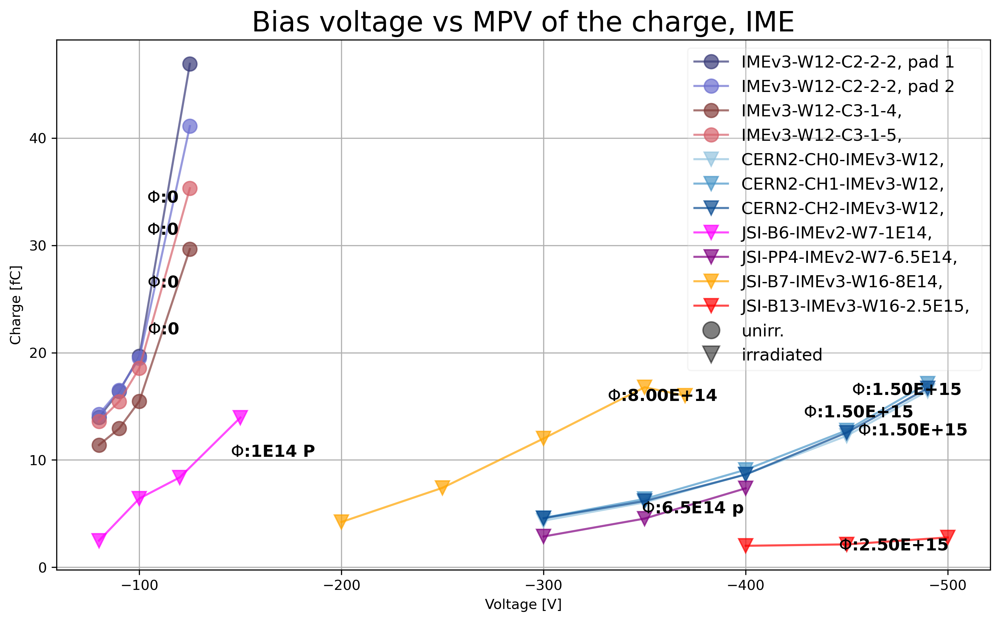

In [101]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)
fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['normal_2500', 'irradiated_2800']

list_of_texts = []
for i,sensor_name in enumerate(IME_names):
#     print(sensor_name)
    for j,key in enumerate(keys_to_plot):
#         print(key)
        df_analysis = dict_analysis_IME[key]
        df_analysis = df_analysis.loc[df_analysis['exclude']==False]
        df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
            charge = np.array(df_analysis.loc[idx[:,:,ch]]['charge'])
            batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, charge,
                    marker=markers[j], markersize=10, alpha=0.7, color=IME_color_map[sensor_name][k],  ### colors are fucked up
                    label=f"{sensor_name}, {pads[k]}")
        ## labels for all the batches
#             for x,y,label in zip(voltage,charge,batch_labels):
#                 list_of_texts.append(ax.text(x, y, label))
            fluence_label = f"$\Phi$:{df_analysis.loc[idx[:,:,ch]]['fluence'].iloc[0]}"
            list_of_texts.append(ax.text(np.mean(voltage[0:2]), np.mean(charge[0:2]), fluence_label ,
                                         fontsize='large', weight='bold'))
    
#             list_of_texts.append(ax.text(np.mean(voltage[-2:]), np.mean(charge[-2:]), labels_for_keys[key],
#                                          fontsize='large', weight='bold'))
        
ax.set_title(f"Bias voltage vs MPV of the charge, IME", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Charge [fC]")
# ax.set_ylim(0,None)
ax.invert_xaxis()

ax.grid('--')
# ax.legend(handler_map={plt.Line2D:HandlerLine2D(update_func=update_prop)})
      
for j,key in enumerate(keys_to_plot):
    ax.plot([],[], marker=markers[j], markersize=12, color='k', linewidth=0, alpha=0.5,
            label=labels_for_keys[key])
    
#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

#specify order of items in legend
order = [3,4,5,6,0,1,2,8,10,9,7,11,12]

#add legend to plot
ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=12, framealpha=0.2, loc='best')
adjust_text(list_of_texts)

### emtpy markers

### Time Resolution

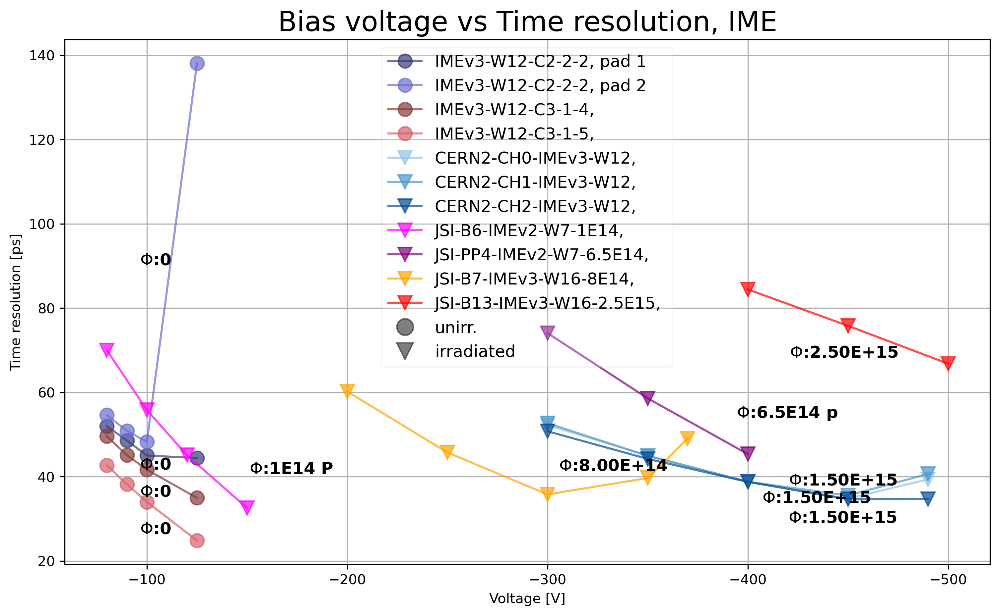

In [102]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)
fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['normal_2500', 'irradiated_2800']

list_of_texts = []
for i,sensor_name in enumerate(IME_names):
#     print(sensor_name)
    for j,key in enumerate(keys_to_plot):
#         print(key)
        df_analysis = dict_analysis_IME[key]
        df_analysis = df_analysis.loc[df_analysis['exclude']==False]
        df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
            time_resolution = np.array(df_analysis.loc[idx[:,:,ch]]['time_resolution'])
            batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, time_resolution,
                    marker=markers[j], markersize=10, alpha=0.7, color=IME_color_map[sensor_name][k],  ### colors are fucked up
                    label=f"{sensor_name}, {pads[k]}")
        ### labels for all the batches
#             for x,y,label in zip(voltage,time_resolution,batch_labels):
#                 list_of_texts.append(ax.text(x, y, label))
            fluence_label = f"$\Phi$:{df_analysis.loc[idx[:,:,ch]]['fluence'].iloc[0]}"
            list_of_texts.append(ax.text(np.mean(voltage[0:2]), np.mean(time_resolution[0:2]), fluence_label ,
                                         fontsize='large', weight='bold'))
    
#             list_of_texts.append(ax.text(np.mean(voltage[-2:]), np.mean(time_resolution[-2:]), labels_for_keys[key],
#                                          fontsize='large', weight='bold'))
        
ax.set_title(f"Bias voltage vs Time resolution, IME", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Time resolution [ps]")
# ax.set_ylim(0,None)
# ax.set_xlim(-150,-50)
ax.invert_xaxis()

ax.grid('--')
# ax.legend(handler_map={plt.Line2D:HandlerLine2D(update_func=update_prop)})
      
for j,key in enumerate(keys_to_plot):
    ax.plot([],[], marker=markers[j], markersize=12, color='k', linewidth=0, alpha=0.5,
            label=labels_for_keys[key])
    
#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

#specify order of items in legend
order = [3,4,5,6,0,1,2,8,10,9,7,11,12]

#add legend to plot
ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=12, framealpha=0.2, loc='best')
adjust_text(list_of_texts)

### emtpy markers

### Efficiency

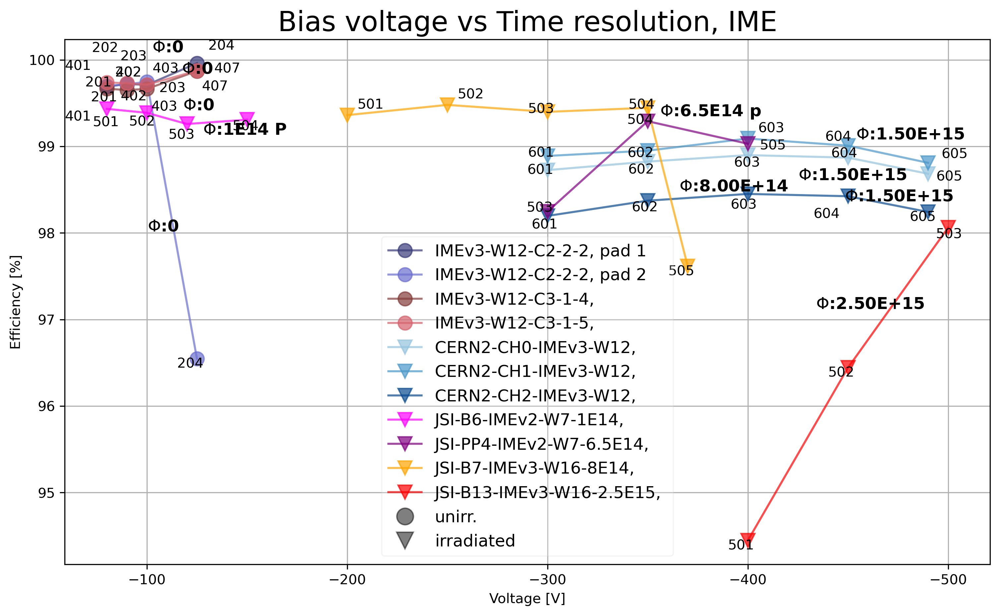

In [104]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)
fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['normal_2500', 'irradiated_2800']

list_of_texts = []
for i,sensor_name in enumerate(IME_names):
#     print(sensor_name)
    for j,key in enumerate(keys_to_plot):
#         print(key)
        df_analysis = dict_analysis_IME[key]
        df_analysis = df_analysis.loc[df_analysis['exclude']==False]
        df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
            time_resolution = np.array(df_analysis.loc[idx[:,:,ch]]['efficiency'])
            batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, time_resolution,
                    marker=markers[j], markersize=10, alpha=0.7, color=IME_color_map[sensor_name][k],  ### colors are fucked up
                    label=f"{sensor_name}, {pads[k]}")
        ### labels for all the batches
            for x,y,label in zip(voltage,time_resolution,batch_labels):
                list_of_texts.append(ax.text(x, y, label))
            fluence_label = f"$\Phi$:{df_analysis.loc[idx[:,:,ch]]['fluence'].iloc[0]}"
            list_of_texts.append(ax.text(np.mean(voltage[0:2]), np.mean(time_resolution[0:2]), fluence_label ,
                                         fontsize='large', weight='bold'))
    
#             list_of_texts.append(ax.text(np.mean(voltage[-2:]), np.mean(time_resolution[-2:]), labels_for_keys[key],
#                                          fontsize='large', weight='bold'))
        
ax.set_title(f"Bias voltage vs Time resolution, IME", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Efficiency [%]")
# ax.set_ylim(90,None)
# ax.set_xlim(-150,-50)
ax.invert_xaxis()

ax.grid('--')
# ax.legend(handler_map={plt.Line2D:HandlerLine2D(update_func=update_prop)})
      
for j,key in enumerate(keys_to_plot):
    ax.plot([],[], marker=markers[j], markersize=12, color='k', linewidth=0, alpha=0.5,
            label=labels_for_keys[key])

#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

#specify order of items in legend
order = [3,4,5,6,0,1,2,8,10,9,7,11,12]

#add legend to plot
ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order], fontsize=12, framealpha=0.2, loc='best')
adjust_text(list_of_texts)

### emtpy markers

## Angled Irradiated

In [108]:
labels_for_keys = {#'normal_2500':'0°',
#                    'room_temp':'20°C',
                   'irradiated_2800':'0°',
                   'angled':'angled',
#                    'angled_irradiated': 'angled and irradiated'
                  }

### Charge

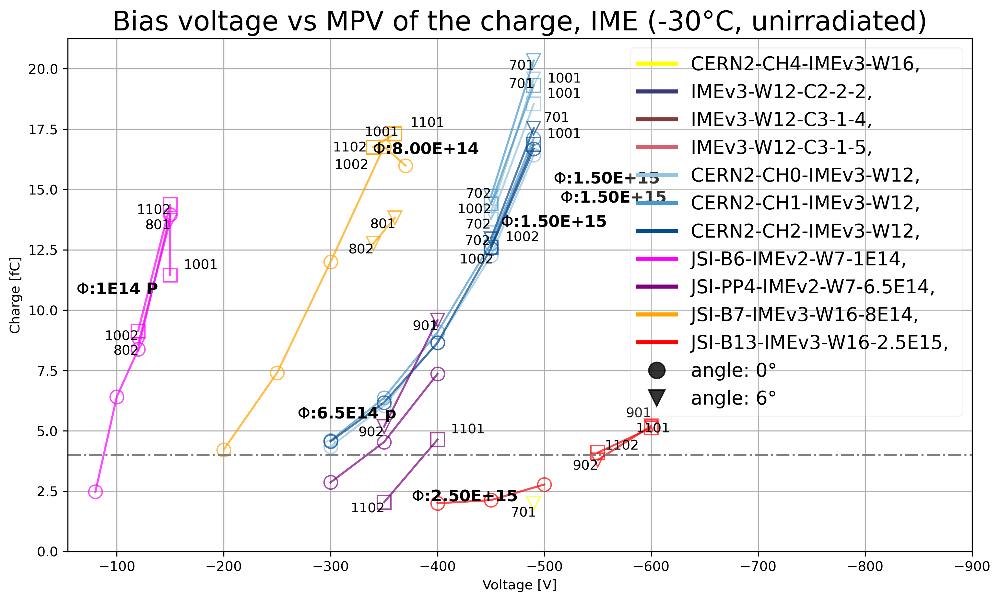

In [145]:
### NEW PLOT (CORRECT SENSOR ASSIGNMENT i HOPE)

fig, ax = plt.subplots(figsize=(12,7), dpi=300)
keys_to_plot = ['irradiated_2800', 'angled_irradiated']

list_of_texts = []
unique_list = []

for i,sensor_name in enumerate(IME_names):
    ### add label of sensor name only with line (no marker) to the legend
    ### this does not generalize if there's multiple pads
    ax.plot([],[], markersize=0, linewidth=3, color=IME_color_map[sensor_name][0], label=f"{sensor_name}, {pads[0]}")
    j = 0
    key = keys_to_plot[j]
    df_analysis = dict_analysis_IME[key]
    df_analysis = df_analysis.loc[df_analysis['exclude']==False]
    df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]

    for k,ch in enumerate(df_analysis.index.unique(2)):
        voltage = np.array(df_analysis.loc[idx[:,:,ch]]['voltage'])
        charge = np.array(df_analysis.loc[idx[:,:,ch]]['charge'])
        batch_labels = np.array(df_analysis.loc[:,:,ch].index.get_level_values('batch'))
        if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
        else:    pads = ['']
        ax.plot(voltage, charge,
                marker=markers[j], markersize=10, alpha=0.7, color=IME_color_map[sensor_name][k], mfc='none')  ### colors are fucked up
        fluence_label = f"$\Phi$:{df_analysis.loc[idx[:,:,ch]]['fluence'].iloc[0]}"
        list_of_texts.append(ax.text(np.mean(voltage[0:2]), np.mean(charge[0:2]), fluence_label ,
                                         fontsize='large', weight='bold'))
    ### labels for all the batches
#         for x,y,label in zip(voltage,charge,batch_labels):
#             list_of_texts.append(ax.text(x, y, label))
    ### labels for all the keys to study
#         list_of_texts.append(ax.text(np.mean(voltage[:]), np.mean(charge[:]), labels_for_keys[key],
#                                      fontsize='large', weight='bold'))      
    j = 1
    key = keys_to_plot[j]
    df_analysis = dict_analysis_IME[key]
    df_analysis = df_analysis.loc[df_analysis['exclude']==False]
    df_analysis = df_analysis.loc[df_analysis['name']==sensor_name]
    for a,this_angle in enumerate(df_analysis['angle'].unique()):
        for k,ch in enumerate(df_analysis.index.unique(2)):
            voltage = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[idx[:,:,ch]]['voltage'])
            charge = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[idx[:,:,ch]]['charge'])
            batch_labels = np.array(df_analysis[df_analysis["angle"]==this_angle].loc[:,:,ch].index.get_level_values('batch'))
            if len(df_analysis.index.unique(2))>1:    pads=['pad 1','pad 2', 'pad 3']
            else:    pads = ['']
            ax.plot(voltage, charge,
                    marker=markers[j+a], markersize=10, alpha=0.7, color=IME_color_map[sensor_name][k], mfc='none')  ### colors are fucked up            
            for x,y,label in zip(voltage,charge,batch_labels):
                list_of_texts.append(ax.text(x, y, label))

ax.plot([],[], marker=markers[0], markersize=12, color='k', alpha=0.8, linewidth=0, linestyle='-',
        label="angle: 0°")
ax.plot([],[], marker=markers[1], markersize=12, color='k', alpha=0.8, linewidth=0, linestyle='-',
        label="angle: 6°")
ax.plot([],[], marker=markers[2], markersize=12, color='k', alpha=0.8, linewidth=0, linestyle='-',
        label="angle: 14°")



ax.axhline(threshold_charge, linestyle='-.', color='grey', label="Threshold charge")

ax.set_title(f"Bias voltage vs MPV of the charge, IME (-30°C, unirradiated)", fontsize=20)
ax.set_xlabel("Voltage [V]")
ax.set_ylabel("Charge [fC]")
ax.set_ylim(0,None)
ax.set_xlim(-900,None)
ax.invert_xaxis()

ax.grid('--')


#get handles and labels
handles, labels = plt.gca().get_legend_handles_labels()

#specify order of items in legend, also allows me to remove some elements
order = [3,4,5,6,0,1,2,8,10,9,7,11,12]

#add legend to plot
ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order],fontsize=14, framealpha=0.2, loc='upper right')
# ax.legend(fontsize=14, framealpha=0.2, loc='best')

adjust_text(list_of_texts)

In [106]:
dict_analysis_IME['angled_irradiated']

,,,name,board,voltage,MCP_voltage,temperature,angle,fluence,charge,charge_error,efficiency,time_resolution,comments,exclude
batch,oscilloscope,channel,,,,,,,,,,,,,
701,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-490,2800,-31.025,14.0,1.50E+15,19.5741,0.018504,98.881635,37.032307,{},False
1001,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-490,2800,-31.2125,6.0,1.50E+15,18.5379,0.024486,98.947691,38.036739,{},False
702,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-450,2800,-30.75,14.0,1.50E+15,14.0518,0.016907,98.910538,33.908942,{},False
1002,S1,Ch2,CERN2-CH0-IMEv3-W12,CERN2,-450,2800,-31.3,6.0,1.50E+15,13.7691,0.015983,98.983794,34.769535,{},False
701,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-490,2800,-31.025,14.0,1.50E+15,20.3396,0.024819,99.153476,37.774231,{},False
1001,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-490,2800,-31.2125,6.0,1.50E+15,19.3114,0.034313,99.102089,38.915835,{},False
702,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-450,2800,-30.75,14.0,1.50E+15,14.7071,0.023252,99.252091,34.375987,{},False
1002,S1,Ch3,CERN2-CH1-IMEv3-W12,CERN2,-450,2800,-31.3,6.0,1.50E+15,14.4003,0.022468,99.091174,35.19322,{},False
701,S1,Ch4,CERN2-CH2-IMEv3-W12,CERN2,-490,2800,-31.025,14.0,1.50E+15,17.5374,0.018938,98.60526,33.416267,{},False


# CNM
looking specifically at one sensor

In [146]:
this_sensor = 'CNM'
IME_names = set()
for name in unique_names:
    if this_sensor in name:
        print(name)
        IME_names.add(name)

CNM-R15973-W5-D138
CNM-R15973-W4-D168
JSI-B5-CNM-W3-2.5E15



Chi^2 formula:
$$
\chi^2 = \sum_i^N \frac{(E_i-O_i)^2}{E_i}\\
\chi^2_{reduced} = \frac{\chi^2}{N-d.o.f}
$$

[INFO] - 	 Loading batch 205 	 Oscilloscope S1


205 S1 Ch2


[INFO] - 	 Loading batch 205 	 Oscilloscope S1


205 S1 Ch3


[INFO] - 	 Loading batch 206 	 Oscilloscope S1


206 S1 Ch2


[INFO] - 	 Loading batch 206 	 Oscilloscope S1


206 S1 Ch3


[INFO] - 	 Loading batch 411 	 Oscilloscope S1


411 S1 Ch4


[INFO] - 	 Loading batch 413 	 Oscilloscope S1


413 S1 Ch4


[INFO] - 	 Loading batch 414 	 Oscilloscope S1


414 S1 Ch4


[INFO] - 	 Loading batch 411 	 Oscilloscope S2


411 S2 Ch4


[INFO] - 	 Loading batch 413 	 Oscilloscope S2


413 S2 Ch4


[INFO] - 	 Loading batch 414 	 Oscilloscope S2


414 S2 Ch4


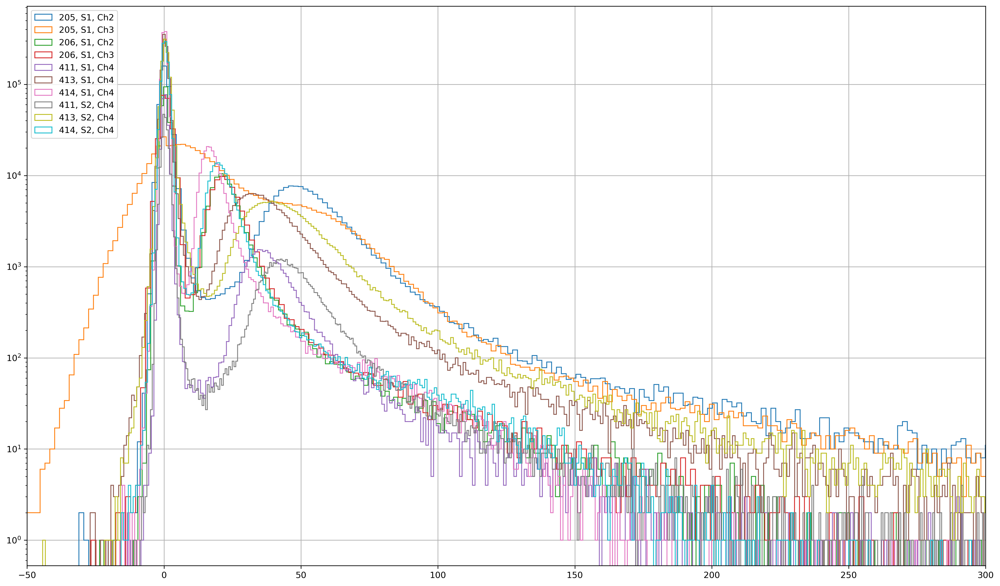

In [147]:
fig,ax = plt.subplots(figsize=(20,12), dpi=300)
for batch, S, ch in dict_analysis_IME['angled'].index:
    print(batch,S,ch)
    df = load_batch(batch,S)
    match ch:
        case 'Ch2': dut = 1
        case 'Ch3': dut = 2
        case 'Ch4': dut = 3
    DUTs = [dut]
#     geo_cuts, geo_infos = zip(*[geometry_mask(df, DUT_number=dut, bins=large_bins, bins_find_min='rice', only_select='normal', use='pulseheight')
#                                 if dut in DUTs else (None,None) for dut in [1,2,3]])
    plot_histogram(df[f'charge_{dut}']/4700, bins=1000, fig_ax=(fig,ax), label=f"{batch}, {S}, {ch}")
ax.semilogy()
ax.set_xlim(-50,300)
ax.legend()